In [67]:
import os
import pandas as pd
import numpy as np
from glob import glob
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats.mstats import pearsonr
from flexitext import flexitext
import matplotlib.pyplot as plt



### Notes
#### Offset: 
- When combining both types of trailers, anterior insula shows a significant positive correlation with negative arousal (r=0.17489; p-value=1.7246341016483672e-06). Also, anterior insual shows a negative correlation with watch scores (r=-0.07491; p-value=0.04175856809627057).
- For horror trailers alone, NAcc has a significant positive correlation with positive arousal (r=0.15077; p-value= 0.003743392014030906); AIns has a significant positive correlation with negative arousal (r=0.13562; p-value=0.009192194315207748). 
- For comedy trailers alone, NAcc has a significant negative correlation with positive arousal (r=-0.11963; p-value=0.021179442433856898). Also, NAcc is negatively correlated with watch scores (r=0.10155; p-value=0.050637663806451946).
#### Positive peak: 
- When combining both trailers, the positive peak of AIns is positively correlated with negative arousal (r=0.092; p-value=0.01235140998911575)
#### Negative peak: 


- Cut out any neural point that has a z-score>3.
- remove watch score bigger than 3.
- Get peak, above 1 std above zero.
- Reality check with V1 for all subjects.


# Homemade functions

In [68]:

def plot_correlations_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Add annotations to the first plot. 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the second plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the third plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fourth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fifth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the sixth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)



In [69]:

def plot_correlations3_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled", "W_score_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Add annotations to the first plot (NAcc-Pos_arousal_scaled). 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=.07, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=.07, y=-.95, fontsize=12)

    # Add annotations to the second plot (NAcc-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=.07, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=.07, y=-1.05, fontsize=12)

    # Add annotations to the third plot (NAcc-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[2][0], 4)) + "; p-value: " + str(round(comedy_corr[2][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[2][0], 4)) + "; p-value: " + str(round(horror_corr[2][1], 5))
    whole_both_trailers_plot.axes[2, 0].text(s=horror_cor_string, x=.07, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the fourth plot (AIns-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=.03, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=.03, y=-.95, fontsize=12)

    # Add annotations to the fifth plot (AIns-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=.03, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=.03, y=-1.05, fontsize=12)

    # Add annotations to the sixth plot (AIns-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[5][0], 4)) + "; p-value: " + str(round(comedy_corr[5][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[5][0], 4)) + "; p-value: " + str(round(horror_corr[5][1], 5))
    whole_both_trailers_plot.axes[2, 1].text(s=horror_cor_string, x=.03, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the seventh plot (MPFC-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=.03, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=.03, y=-.95, fontsize=12)

    # Add annotations to the eighth plot (MPFC-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=.03, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=.03, y=-1.05, fontsize=12)

    # Add annotations to the ninth plot (MPFC-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[8][0], 4)) + "; p-value: " + str(round(comedy_corr[8][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[8][0], 4)) + "; p-value: " + str(round(horror_corr[8][1], 5))
    whole_both_trailers_plot.axes[2, 2].text(s=horror_cor_string, x=.03, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)




In [70]:
# Fuction to create scatter plots with corr.
def plot_correlations(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.regplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green")
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

In [71]:
# Fuction to create scatter plots with corr.
def plot_correlations_2trailers(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.relplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", hue="Type", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green", logistic=True)
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

# Clean data

In [72]:
# Open a datasets directory. 
fd = os.open("/Users/luisalvarez/Documents/GitHub", os.O_RDONLY)

# Use os.fchdir() method to change the current dir/folder.
os.fchdir(fd)

# Safe check- Print current working directory
print("Current working dir : %s" % os.getcwd())

Current working dir : /Users/luisalvarez/Documents/GitHub


In [73]:
# Open csv file. 
all_subs_events_df = pd.read_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation.csv')
all_subs_events_df.shape

(804, 50)

In [74]:
# Drop outliers from positive arousal. 
print("The shape of the dataframe before dropping outliers is: ", all_subs_events_df.shape)
all_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal"] < 3]
all_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal_scaled"] < 1.45]
print("The shape of the dataframe after dropping 'positive arousal' outliers is: ", all_subs_events_df.shape)

# Drop outliers from negative arousal.
all_subs_events_df = all_subs_events_df[all_subs_events_df["Neg_arousal"] < 1.5]
print("The shape of the dataframe after dropping 'negative arousal' outliers is: ", all_subs_events_df.shape)

# Drop outliers from watch score.

# Drop outliers from NAcc.
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] < 0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] > -0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle"] > -0.8]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_neg_peak"] > -1.4]
print("The shape of the dataframe after dropping 'NAcc' outliers is: ", all_subs_events_df.shape)

# Drop outliers from AIns.
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_whole"] < 0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_onset"] > -1.1]
print("The shape of the dataframe after dropping 'AIns' outliers is: ", all_subs_events_df.shape)





The shape of the dataframe before dropping outliers is:  (804, 50)
The shape of the dataframe after dropping 'positive arousal' outliers is:  (802, 50)
The shape of the dataframe after dropping 'negative arousal' outliers is:  (801, 50)
The shape of the dataframe after dropping 'NAcc' outliers is:  (796, 50)
The shape of the dataframe after dropping 'AIns' outliers is:  (794, 50)


In [75]:
# Separate files based on type of trailer. 
all_subs_events_horror = all_subs_events_df[all_subs_events_df["Type"] == "Horror"]
all_subs_events_horror.reset_index(drop=True, inplace=True)
all_subs_events_horror.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_Horror.csv')

all_subs_events_comedy = all_subs_events_df[all_subs_events_df["Type"] == "Comedy"]
all_subs_events_comedy.reset_index(drop=True, inplace=True)
all_subs_events_comedy.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_Comedy.csv')


# Visualize data 

## Behavioral Associations. 

The correlation between W_score and Pos_arousal is: 0.854 with a p-value of: 6.630344869069316e-227
The correlation between W_score and Neg_arousal is: -0.6553 with a p-value of: 1.3234460787195175e-98


Text(-0.8, -2, 'r= -0.6553; p-value: 1.3234460787195175e-98')

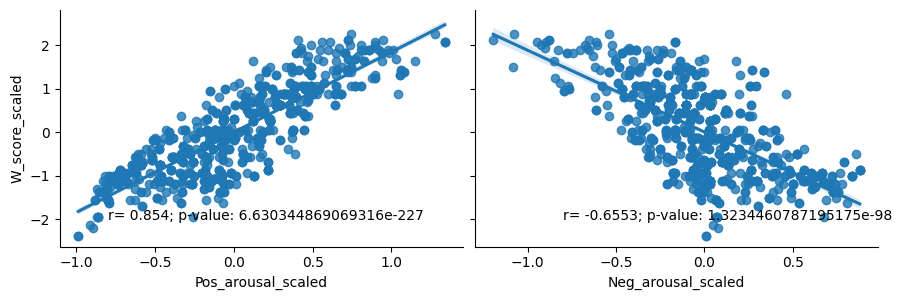

In [76]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for both types of trailers. 
W_PA_All_corr = pearsonr(all_subs_events_df["W_score_scaled"], all_subs_events_df["Pos_arousal_scaled"])
W_NA_All_corr = pearsonr(all_subs_events_df["W_score_scaled"], all_subs_events_df["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal is: " + str(round(W_PA_All_corr[0], 4)) + " with a p-value of: " + str((W_PA_All_corr[1])))
print("The correlation between W_score and Neg_arousal is: " + str(round(W_NA_All_corr[0], 4)) + " with a p-value of: " + str((W_NA_All_corr[1])))

W_PA_NA_behavioral_plot = sns.pairplot(
    all_subs_events_df,
    kind="reg",
    x_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"],
    y_vars=["W_score_scaled"], 
    palette="crest",
    height=3,
    aspect=1.5)

# Add annotation to the plot. 
W_PA_string = "r= " + str(round(W_PA_All_corr[0], 4)) + "; p-value: " + str((W_PA_All_corr[1]))
W_PA_NA_behavioral_plot.axes[0, 0].text(s=W_PA_string, x=-.8, y=-2, fontsize=10)
W_NA_string = "r= " + str(round(W_NA_All_corr[0], 4)) + "; p-value: " + str((W_NA_All_corr[1]))
W_PA_NA_behavioral_plot.axes[0, 1].text(s=W_NA_string, x=-.8, y=-2, fontsize=10)


In [77]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for comedy trailers.
W_PA_comedy_corr = pearsonr(all_subs_events_comedy["W_score_scaled"], all_subs_events_comedy["Pos_arousal_scaled"])
W_PA_comedy_corr = pearsonr(all_subs_events_comedy["W_score_scaled"], all_subs_events_comedy["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal for comedy trailers is: " + str(round(W_PA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_PA_comedy_corr[1])))
print("The correlation between A_score and Pos_arousal for comedy trailers is: " + str(round(W_PA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_PA_comedy_corr[1])))

# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for horror trailers.
W_PA_horror_corr = pearsonr(all_subs_events_horror["W_score_scaled"], all_subs_events_horror["Pos_arousal_scaled"])
W_PA_horror_corr = pearsonr(all_subs_events_horror["W_score_scaled"], all_subs_events_horror["Neg_arousal_scaled"])

print("\nThe correlation between W_score and Pos_arousal for horror trailers is: " + str(round(W_PA_horror_corr[0], 4)) + " with a p-value of: " + str((W_PA_horror_corr[1])))
print("The correlation between A_score and Pos_arousal for horror trailers is: " + str(round(W_PA_horror_corr[0], 4)) + " with a p-value of: " + str((W_PA_horror_corr[1])))


The correlation between W_score and Pos_arousal for comedy trailers is: -0.6783 with a p-value of: 4.3359564232706945e-55
The correlation between A_score and Pos_arousal for comedy trailers is: -0.6783 with a p-value of: 4.3359564232706945e-55

The correlation between W_score and Pos_arousal for horror trailers is: -0.6375 with a p-value of: 1.9856907643165405e-46
The correlation between A_score and Pos_arousal for horror trailers is: -0.6375 with a p-value of: 1.9856907643165405e-46


Text(-0.8, -2.5, 'H r= -0.6375; p-value: 1.9856907643165405e-46')

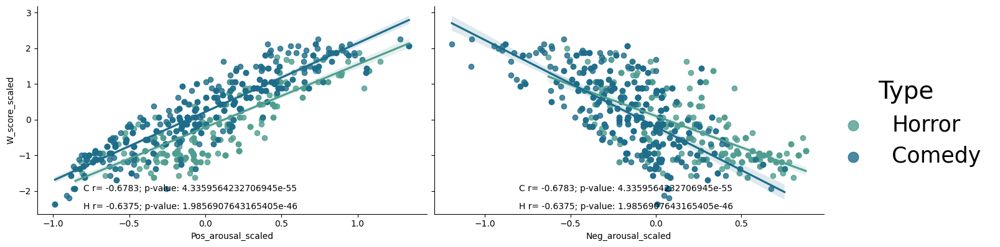

In [78]:
W_PA_NA_bothTrailers_behavioral_plot = sns.pairplot(
    all_subs_events_df,
    kind="reg",
    x_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"],
    y_vars=["W_score_scaled"], 
    palette="crest",
    hue="Type",
    height=4,
    aspect=1.7)

W_comedy_PA_string = "C r= " + str(round(W_PA_comedy_corr[0], 4)) + "; p-value: " + str((W_PA_comedy_corr[1]))
W_horror_PA_string = "H r= " + str(round(W_PA_horror_corr[0], 4)) + "; p-value: " + str((W_PA_horror_corr[1]))
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 0].text(s=W_comedy_PA_string, x=-.8, y=-2, fontsize=10)
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 0].text(s=W_horror_PA_string, x=-.8, y=-2.5, fontsize=10)

W_comedy_NA_string = "C r= " + str(round(W_PA_comedy_corr[0], 4)) + "; p-value: " + str((W_PA_comedy_corr[1]))
W_horror_NA_string = "H r= " + str(round(W_PA_horror_corr[0], 4)) + "; p-value: " + str((W_PA_horror_corr[1]))
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 1].text(s=W_comedy_NA_string, x=-.8, y=-2, fontsize=10)
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 1].text(s=W_horror_NA_string, x=-.8, y=-2.5, fontsize=10)

<Axes: xlabel='Type', ylabel='Neg_arousal_scaled'>

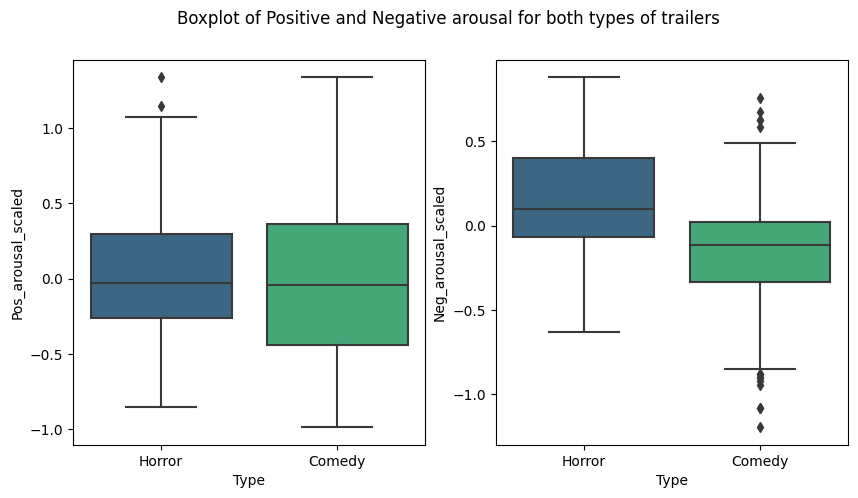

In [123]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5), sharex=True)
fig.suptitle("Boxplot of Positive and Negative arousal for both types of trailers")
sns.boxplot(data=all_subs_events_df, y="Pos_arousal_scaled", x="Type", palette="viridis", ax=axs[0])
sns.boxplot(data=all_subs_events_df, y="Neg_arousal_scaled", x="Type", palette="viridis", ax=axs[1])


<Axes: xlabel='Pos_arousal_scaled', ylabel='Count'>

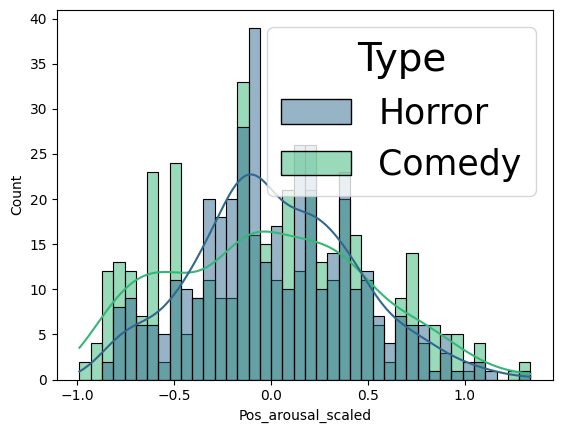

In [80]:
sns.histplot(data=all_subs_events_df, x="Pos_arousal_scaled", hue="Type", kde=True, palette="viridis", bins=40)
#sns.histplot(data=all_subs_events_df, x="Neg_arousal_scaled", hue="Type", kde=True, palette="viridis", bins=40)



<Axes: xlabel='W_score_scaled', ylabel='Count'>

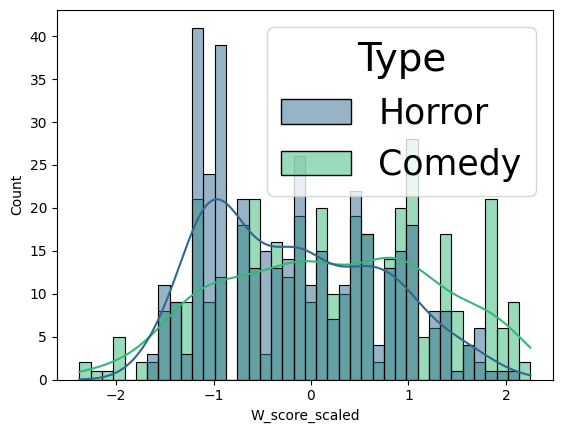

In [126]:
sns.histplot(data=all_subs_events_df, x="W_score_scaled", hue="Type", kde=True, palette="viridis", bins=40)

/var/folders/0z/1yt2h6410kb7_mgghf4q28z00000gn/T/ipykernel_17786/3263024937.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.displot(data=all_subs_events_df, x="W_score", row="Trailer", kde=True, palette="viridis")


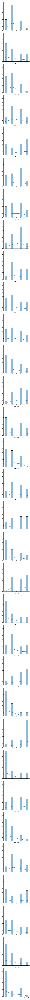

In [133]:
sns.displot(data=all_subs_events_df, x="W_score", row="Trailer", kde=True, palette="viridis")

## Neural Activation Whole Average 

In [81]:
# Correlation with Positive Arousal. 
NAcc_PA_whole_All_corr = pearsonr(all_subs_events_df["NAcc_whole"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_whole_All_corr = pearsonr(all_subs_events_df["AIns_whole"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_whole_All_corr = pearsonr(all_subs_events_df["MPFC_whole"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_whole_All_corr = pearsonr(all_subs_events_df["NAcc_whole"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_whole_All_corr = pearsonr(all_subs_events_df["AIns_whole"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_whole_All_corr = pearsonr(all_subs_events_df["MPFC_whole"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores. 
NAcc_W_whole_All_corr = pearsonr(all_subs_events_df["NAcc_whole"], all_subs_events_df["W_score_scaled"])
AIns_W_whole_All_corr = pearsonr(all_subs_events_df["AIns_whole"], all_subs_events_df["W_score_scaled"])
MPFC_W_whole_All_corr = pearsonr(all_subs_events_df["MPFC_whole"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc whole activation and positive arousal is: " + str(round(NAcc_PA_whole_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_whole_All_corr[1])))
print("For both types of trailers, the correlation between AIns whole activation and positive arousal is: " + str(round(AIns_PA_whole_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_whole_All_corr[1])))
print("For both types of trailers, the correlation between MPFC whole activation and positive arousal is: " + str(round(MPFC_PA_whole_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_whole_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc whole activation and negative arousal is: " + str(round(NAcc_NA_whole_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_whole_All_corr[1])))
print("For both types of trailers, the correlation between AIns whole activation and negative arousal is: " + str(round(AIns_NA_whole_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_whole_All_corr[1])))
print("For both types of trailers, the correlation between MPFC whole activation and negative arousal is: " + str(round(MPFC_NA_whole_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_whole_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc whole activation and watch scores is: " + str(round(NAcc_W_whole_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_whole_All_corr[1])))
print("For both types of trailers, the correlation between AIns whole activation and watch scores is: " + str(round(AIns_W_whole_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_whole_All_corr[1])))
print("For both types of trailers, the correlation between MPFC whole activation and watch scores is: " + str(round(MPFC_W_whole_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_whole_All_corr[1])))


For both types of trailers, the correlation between NAcc whole activation and positive arousal is: -0.00286 with a p-value of: 0.9358179679006567
For both types of trailers, the correlation between AIns whole activation and positive arousal is: 0.00213 with a p-value of: 0.9523073481589364
For both types of trailers, the correlation between MPFC whole activation and positive arousal is: -0.07779 with a p-value of: 0.02838989125236309

For both types of trailers, the correlation between NAcc whole activation and negative arousal is: 0.02603 with a p-value of: 0.4639781604398956
For both types of trailers, the correlation between AIns whole activation and negative arousal is: 0.16659 with a p-value of: 2.3603838867070172e-06
For both types of trailers, the correlation between MPFC whole activation and negative arousal is: 0.00667 with a p-value of: 0.8511272263665071

For both types of trailers, the correlation between NAcc whole activation and watch scores is: -0.00782 with a p-value of

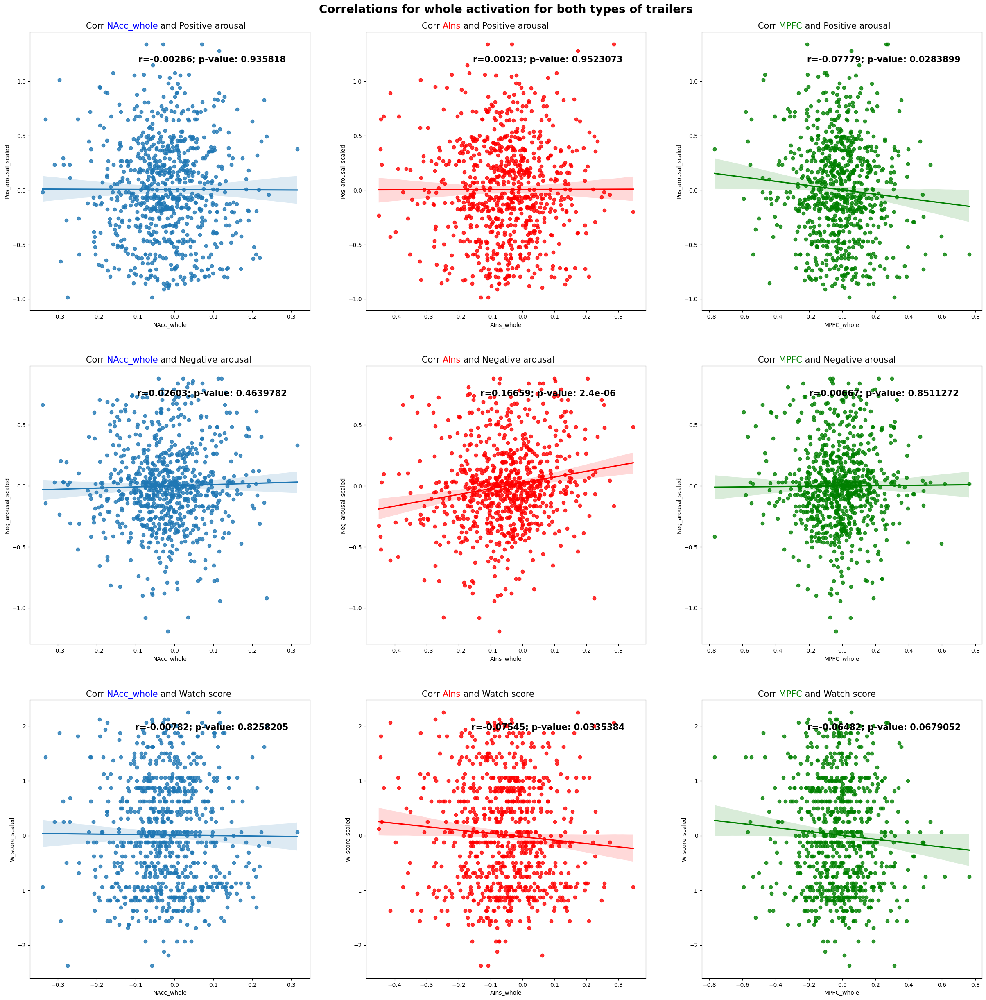

In [82]:
whole_all_corr = [NAcc_PA_whole_All_corr, NAcc_NA_whole_All_corr, NAcc_W_whole_All_corr, AIns_PA_whole_All_corr, AIns_NA_whole_All_corr, AIns_W_whole_All_corr, MPFC_PA_whole_All_corr, MPFC_NA_whole_All_corr, MPFC_W_whole_All_corr]

plot_correlations(all_subs_events_df, whole_all_corr, "whole", "Correlations for whole activation for both types of trailers")

In [83]:
# Whole Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_whole_C_corr = pearsonr(all_subs_events_comedy["NAcc_whole"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_whole_C_corr = pearsonr(all_subs_events_comedy["AIns_whole"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_whole_C_corr = pearsonr(all_subs_events_comedy["MPFC_whole"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_whole_C_corr = pearsonr(all_subs_events_comedy["NAcc_whole"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_whole_C_corr = pearsonr(all_subs_events_comedy["AIns_whole"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_whole_C_corr = pearsonr(all_subs_events_comedy["MPFC_whole"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_whole_C_corr = pearsonr(all_subs_events_comedy["NAcc_whole"], all_subs_events_comedy["W_score_scaled"])
AIns_W_whole_C_corr = pearsonr(all_subs_events_comedy["AIns_whole"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_whole_C_corr = pearsonr(all_subs_events_comedy["MPFC_whole"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc whole activation and positive arousal is: " + str(round(NAcc_PA_whole_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_whole_C_corr[1])))
print("For comedy trailers, the correlation between AIns whole activation and positive arousal is: " + str(round(AIns_PA_whole_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_whole_C_corr[1])))
print("For comedy trailers, the correlation between MPFC whole activation and positive arousal is: " + str(round(MPFC_PA_whole_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_whole_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc whole activation and negative arousal is: " + str(round(NAcc_NA_whole_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_whole_C_corr[1])))
print("For comedy trailers, the correlation between AIns whole activation and negative arousal is: " + str(round(AIns_NA_whole_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_whole_C_corr[1])))
print("For comedy trailers, the correlation between MPFC whole activation and negative arousal is: " + str(round(MPFC_NA_whole_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_whole_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc whole activation and watch scores is: " + str(round(NAcc_W_whole_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_whole_C_corr[1])))
print("For comedy trailers, the correlation between AIns whole activation and watch scores is: " + str(round(AIns_W_whole_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_whole_C_corr[1])))
print("For comedy trailers, the correlation between MPFC whole activation and watch scores is: " + str(round(MPFC_W_whole_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_whole_C_corr[1])))
      
      

For comedy trailers, the correlation between NAcc whole activation and positive arousal is: -0.04209 with a p-value of: 0.4017183980399937
For comedy trailers, the correlation between AIns whole activation and positive arousal is: -0.04386 with a p-value of: 0.3821998360884474
For comedy trailers, the correlation between MPFC whole activation and positive arousal is: -0.12191 with a p-value of: 0.014827092382767037

For comedy trailers, the correlation between NAcc whole activation and negative arousal is: 0.0242 with a p-value of: 0.6298193089410618
For comedy trailers, the correlation between AIns whole activation and negative arousal is: 0.12068 with a p-value of: 0.01587276104132782
For comedy trailers, the correlation between MPFC whole activation and negative arousal is: 0.0413 with a p-value of: 0.4106746756136774

For comedy trailers, the correlation between NAcc whole activation and watch scores is: -0.03676 with a p-value of: 0.4639820354527766
For comedy trailers, the correl

In [84]:
# Whole Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_whole_H_corr = pearsonr(all_subs_events_horror["NAcc_whole"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_whole_H_corr = pearsonr(all_subs_events_horror["AIns_whole"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_whole_H_corr = pearsonr(all_subs_events_horror["MPFC_whole"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_whole_H_corr = pearsonr(all_subs_events_horror["NAcc_whole"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_whole_H_corr = pearsonr(all_subs_events_horror["AIns_whole"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_whole_H_corr = pearsonr(all_subs_events_horror["MPFC_whole"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_whole_H_corr = pearsonr(all_subs_events_horror["NAcc_whole"], all_subs_events_horror["W_score_scaled"])
AIns_W_whole_H_corr = pearsonr(all_subs_events_horror["AIns_whole"], all_subs_events_horror["W_score_scaled"])
MPFC_W_whole_H_corr = pearsonr(all_subs_events_horror["MPFC_whole"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc whole activation and positive arousal is: " + str(round(NAcc_PA_whole_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_whole_H_corr[1])))
print("For horror trailers, the correlation between AIns whole activation and positive arousal is: " + str(round(AIns_PA_whole_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_whole_H_corr[1])))
print("For horror trailers, the correlation between MPFC whole activation and positive arousal is: " + str(round(MPFC_PA_whole_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_whole_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc whole activation and negative arousal is: " + str(round(NAcc_NA_whole_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_whole_H_corr[1])))
print("For horror trailers, the correlation between AIns whole activation and negative arousal is: " + str(round(AIns_NA_whole_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_whole_H_corr[1])))
print("For horror trailers, the correlation between MPFC whole activation and negative arousal is: " + str(round(MPFC_NA_whole_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_whole_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc whole activation and watch scores is: " + str(round(NAcc_W_whole_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_whole_H_corr[1])))
print("For horror trailers, the correlation between AIns whole activation and watch scores is: " + str(round(AIns_W_whole_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_whole_H_corr[1])))
print("For horror trailers, the correlation between MPFC whole activation and watch scores is: " + str(round(MPFC_W_whole_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_whole_H_corr[1])))



For horror trailers, the correlation between NAcc whole activation and positive arousal is: 0.0445 with a p-value of: 0.37774748810316194
For horror trailers, the correlation between AIns whole activation and positive arousal is: 0.04041 with a p-value of: 0.42313280354722577
For horror trailers, the correlation between MPFC whole activation and positive arousal is: -0.02063 with a p-value of: 0.6827733018032227

For horror trailers, the correlation between NAcc whole activation and negative arousal is: 0.03478 with a p-value of: 0.4906882479599963
For horror trailers, the correlation between AIns whole activation and negative arousal is: 0.05066 with a p-value of: 0.3152632610822557
For horror trailers, the correlation between MPFC whole activation and negative arousal is: -0.02112 with a p-value of: 0.675594290750598

For horror trailers, the correlation between NAcc whole activation and watch scores is: 0.02595 with a p-value of: 0.6070505624019815
For horror trailers, the correlati

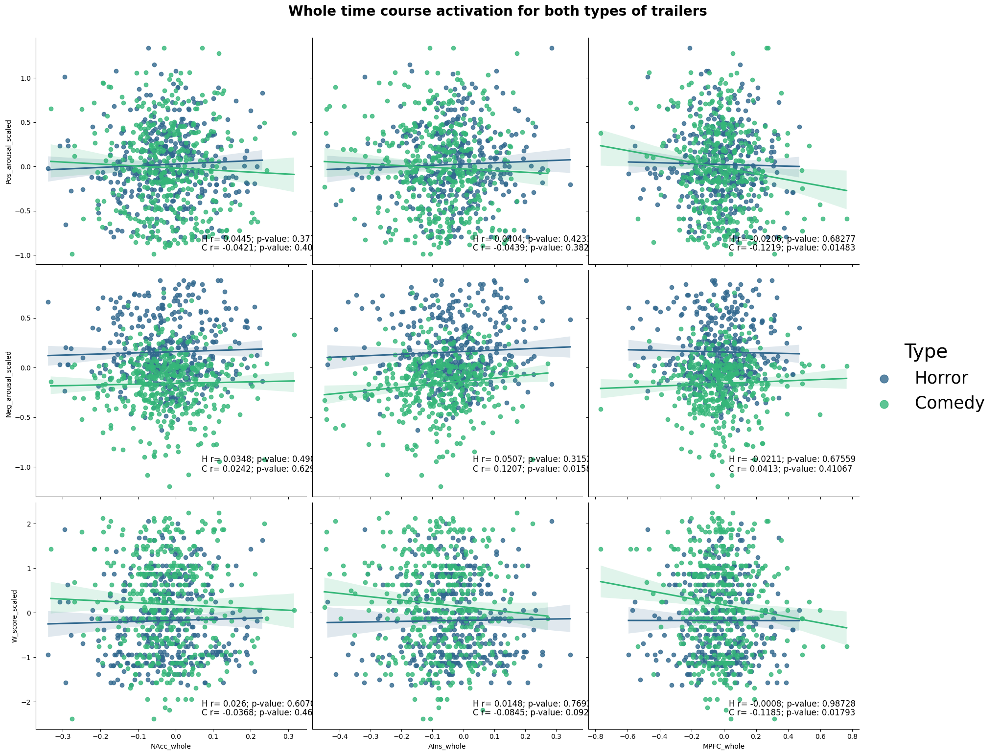

In [85]:
whole_comedy_corr = [NAcc_PA_whole_C_corr, NAcc_NA_whole_C_corr, NAcc_W_whole_C_corr, AIns_PA_whole_C_corr, AIns_NA_whole_C_corr, AIns_W_whole_C_corr, MPFC_PA_whole_C_corr, MPFC_NA_whole_C_corr, MPFC_W_whole_C_corr]
whole_horror_corr = [NAcc_PA_whole_H_corr, NAcc_NA_whole_H_corr, NAcc_W_whole_H_corr, AIns_PA_whole_H_corr, AIns_NA_whole_H_corr, AIns_W_whole_H_corr, MPFC_PA_whole_H_corr, MPFC_NA_whole_H_corr, MPFC_W_whole_H_corr]

title_whole = 'Whole time course activation for both types of trailers'
plot_correlations3_bothTrailers(all_subs_events_df, "whole", whole_comedy_corr, whole_horror_corr, title_whole)

## Neural Activation Offset 

In [86]:
# Correlation with Positive Arousal. 
NAcc_PA_Off_All_corr = pearsonr(all_subs_events_df["NAcc_offset"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Off_All_corr = pearsonr(all_subs_events_df["AIns_offset"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Off_All_corr = pearsonr(all_subs_events_df["MPFC_offset"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Off_All_corr = pearsonr(all_subs_events_df["NAcc_offset"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Off_All_corr = pearsonr(all_subs_events_df["AIns_offset"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Off_All_corr = pearsonr(all_subs_events_df["MPFC_offset"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Off_All_corr = pearsonr(all_subs_events_df["NAcc_offset"], all_subs_events_df["W_score_scaled"])
AIns_W_Off_All_corr = pearsonr(all_subs_events_df["AIns_offset"], all_subs_events_df["W_score_scaled"])
MPFC_W_Off_All_corr = pearsonr(all_subs_events_df["MPFC_offset"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc offset activation and positive arousal is: " + str(round(NAcc_PA_Off_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Off_All_corr[1])))
print("For both types of trailers, the correlation between AIns offset activation and positive arousal is: " + str(round(AIns_PA_Off_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Off_All_corr[1])))
print("For both types of trailers, the correlation between MPFC offset activation and positive arousal is: " + str(round(MPFC_PA_Off_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Off_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc offset activation and negative arousal is: " + str(round(NAcc_NA_Off_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Off_All_corr[1])))
print("For both types of trailers, the correlation between AIns offset activation and negative arousal is: " + str(round(AIns_NA_Off_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Off_All_corr[1])))
print("For both types of trailers, the correlation between MPFC offset activation and negative arousal is: " + str(round(MPFC_NA_Off_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Off_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc offset activation and watch scores is: " + str(round(NAcc_W_Off_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Off_All_corr[1])))
print("For both types of trailers, the correlation between AIns offset activation and watch scores is: " + str(round(AIns_W_Off_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Off_All_corr[1])))
print("For both types of trailers, the correlation between MPFC offset activation and watch scores is: " + str(round(MPFC_W_Off_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Off_All_corr[1])))

For both types of trailers, the correlation between NAcc offset activation and positive arousal is: 0.00294 with a p-value of: 0.9341666947649352
For both types of trailers, the correlation between AIns offset activation and positive arousal is: -0.00479 with a p-value of: 0.8928724453347047
For both types of trailers, the correlation between MPFC offset activation and positive arousal is: -0.04459 with a p-value of: 0.20945340164169146

For both types of trailers, the correlation between NAcc offset activation and negative arousal is: 0.02039 with a p-value of: 0.5662221257917469
For both types of trailers, the correlation between AIns offset activation and negative arousal is: 0.17543 with a p-value of: 6.558318509902923e-07
For both types of trailers, the correlation between MPFC offset activation and negative arousal is: 0.05318 with a p-value of: 0.1343140707018865

For both types of trailers, the correlation between NAcc offset activation and watch scores is: -0.01072 with a p-va

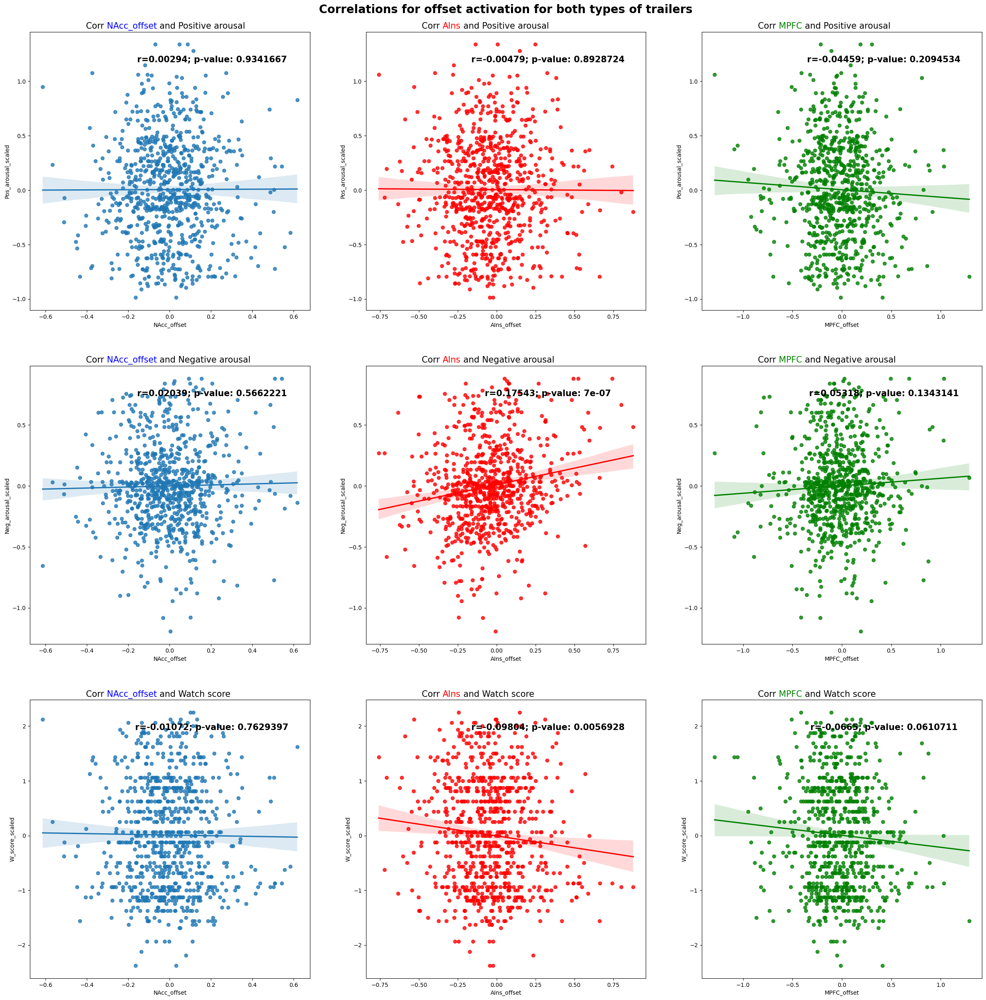

In [87]:
offset_all_corr = [NAcc_PA_Off_All_corr, NAcc_NA_Off_All_corr, NAcc_W_Off_All_corr, AIns_PA_Off_All_corr, AIns_NA_Off_All_corr, AIns_W_Off_All_corr, MPFC_PA_Off_All_corr, MPFC_NA_Off_All_corr, MPFC_W_Off_All_corr]
plot_correlations(all_subs_events_df, offset_all_corr, "offset", "Correlations for offset activation for both types of trailers")

In [88]:
# Offset Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_Off_C_corr = pearsonr(all_subs_events_comedy["NAcc_offset"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_Off_C_corr = pearsonr(all_subs_events_comedy["AIns_offset"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_Off_C_corr = pearsonr(all_subs_events_comedy["MPFC_offset"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_Off_C_corr = pearsonr(all_subs_events_comedy["NAcc_offset"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_Off_C_corr = pearsonr(all_subs_events_comedy["AIns_offset"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_Off_C_corr = pearsonr(all_subs_events_comedy["MPFC_offset"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_Off_C_corr = pearsonr(all_subs_events_comedy["NAcc_offset"], all_subs_events_comedy["W_score_scaled"])
AIns_W_Off_C_corr = pearsonr(all_subs_events_comedy["AIns_offset"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_Off_C_corr = pearsonr(all_subs_events_comedy["MPFC_offset"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc offset activation and positive arousal is: " + str(round(NAcc_PA_Off_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Off_C_corr[1])))
print("For comedy trailers, the correlation between AIns offset activation and positive arousal is: " + str(round(AIns_PA_Off_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Off_C_corr[1])))
print("For comedy trailers, the correlation between MPFC offset activation and positive arousal is: " + str(round(MPFC_PA_Off_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Off_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc offset activation and negative arousal is: " + str(round(NAcc_NA_Off_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Off_C_corr[1])))
print("For comedy trailers, the correlation between AIns offset activation and negative arousal is: " + str(round(AIns_NA_Off_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Off_C_corr[1])))
print("For comedy trailers, the correlation between MPFC offset activation and negative arousal is: " + str(round(MPFC_NA_Off_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Off_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc offset activation and watch scores is: " + str(round(NAcc_W_Off_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Off_C_corr[1])))
print("For comedy trailers, the correlation between AIns offset activation and watch scores is: " + str(round(AIns_W_Off_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Off_C_corr[1])))
print("For comedy trailers, the correlation between MPFC offset activation and watch scores is: " + str(round(MPFC_W_Off_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Off_C_corr[1])))
      

For comedy trailers, the correlation between NAcc offset activation and positive arousal is: -0.09438 with a p-value of: 0.05961578989783574
For comedy trailers, the correlation between AIns offset activation and positive arousal is: -0.07052 with a p-value of: 0.15970729209352655
For comedy trailers, the correlation between MPFC offset activation and positive arousal is: -0.09345 with a p-value of: 0.06220869809651767

For comedy trailers, the correlation between NAcc offset activation and negative arousal is: -0.00673 with a p-value of: 0.893435102562245
For comedy trailers, the correlation between AIns offset activation and negative arousal is: 0.10134 with a p-value of: 0.043060679178871034
For comedy trailers, the correlation between MPFC offset activation and negative arousal is: 0.03684 with a p-value of: 0.4630629103576298

For comedy trailers, the correlation between NAcc offset activation and watch scores is: -0.07367 with a p-value of: 0.14186804613032858
For comedy trailers

In [89]:
# Offset Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_Off_H_corr = pearsonr(all_subs_events_horror["NAcc_offset"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_Off_H_corr = pearsonr(all_subs_events_horror["AIns_offset"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_Off_H_corr = pearsonr(all_subs_events_horror["MPFC_offset"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_Off_H_corr = pearsonr(all_subs_events_horror["NAcc_offset"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_Off_H_corr = pearsonr(all_subs_events_horror["AIns_offset"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_Off_H_corr = pearsonr(all_subs_events_horror["MPFC_offset"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_Off_H_corr = pearsonr(all_subs_events_horror["NAcc_offset"], all_subs_events_horror["W_score_scaled"])
AIns_W_Off_H_corr = pearsonr(all_subs_events_horror["AIns_offset"], all_subs_events_horror["W_score_scaled"])
MPFC_W_Off_H_corr = pearsonr(all_subs_events_horror["MPFC_offset"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc offset activation and positive arousal is: " + str(round(NAcc_PA_Off_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Off_H_corr[1])))
print("For horror trailers, the correlation between AIns offset activation and positive arousal is: " + str(round(AIns_PA_Off_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Off_H_corr[1])))
print("For horror trailers, the correlation between MPFC offset activation and positive arousal is: " + str(round(MPFC_PA_Off_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Off_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc offset activation and negative arousal is: " + str(round(NAcc_NA_Off_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Off_H_corr[1])))
print("For horror trailers, the correlation between AIns offset activation and negative arousal is: " + str(round(AIns_NA_Off_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Off_H_corr[1])))
print("For horror trailers, the correlation between MPFC offset activation and negative arousal is: " + str(round(MPFC_NA_Off_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Off_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc offset activation and watch scores is: " + str(round(NAcc_W_Off_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Off_H_corr[1])))
print("For horror trailers, the correlation between AIns offset activation and watch scores is: " + str(round(AIns_W_Off_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Off_H_corr[1])))
print("For horror trailers, the correlation between MPFC offset activation and watch scores is: " + str(round(MPFC_W_Off_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Off_H_corr[1])))

For horror trailers, the correlation between NAcc offset activation and positive arousal is: 0.11328 with a p-value of: 0.02435054016023194
For horror trailers, the correlation between AIns offset activation and positive arousal is: 0.05045 with a p-value of: 0.3172200724075035
For horror trailers, the correlation between MPFC offset activation and positive arousal is: 0.0114 with a p-value of: 0.821381535106736

For horror trailers, the correlation between NAcc offset activation and negative arousal is: 0.04483 with a p-value of: 0.3742444243749703
For horror trailers, the correlation between AIns offset activation and negative arousal is: 0.13211 with a p-value of: 0.008569306296610724
For horror trailers, the correlation between MPFC offset activation and negative arousal is: 0.03801 with a p-value of: 0.4512354968468782

For horror trailers, the correlation between NAcc offset activation and watch scores is: 0.06093 with a p-value of: 0.22694650204903993
For horror trailers, the co

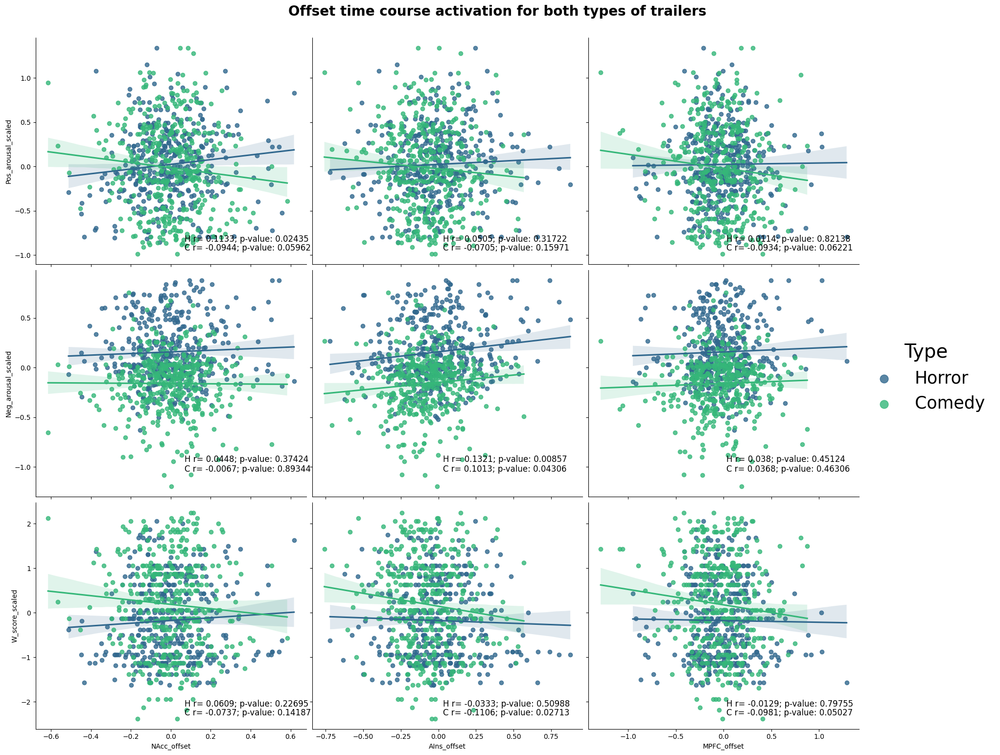

In [90]:
offset_horror_corr = [NAcc_PA_Off_H_corr, NAcc_NA_Off_H_corr, NAcc_W_Off_H_corr, AIns_PA_Off_H_corr, AIns_NA_Off_H_corr, AIns_W_Off_H_corr, MPFC_PA_Off_H_corr, MPFC_NA_Off_H_corr, MPFC_W_Off_H_corr]
offset_comedy_corr = [NAcc_PA_Off_C_corr, NAcc_NA_Off_C_corr, NAcc_W_Off_C_corr, AIns_PA_Off_C_corr, AIns_NA_Off_C_corr, AIns_W_Off_C_corr, MPFC_PA_Off_C_corr, MPFC_NA_Off_C_corr, MPFC_W_Off_C_corr]

title_offset = 'Offset time course activation for both types of trailers'
plot_correlations3_bothTrailers(all_subs_events_df, "offset", offset_comedy_corr, offset_horror_corr, title_offset)


# Neural activation middle

In [91]:
# Correlation with Positive Arousal.
NAcc_PA_Mid_All_corr = pearsonr(all_subs_events_df["NAcc_middle"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Mid_All_corr = pearsonr(all_subs_events_df["AIns_middle"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Mid_All_corr = pearsonr(all_subs_events_df["MPFC_middle"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Mid_All_corr = pearsonr(all_subs_events_df["NAcc_middle"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Mid_All_corr = pearsonr(all_subs_events_df["AIns_middle"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Mid_All_corr = pearsonr(all_subs_events_df["MPFC_middle"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Mid_All_corr = pearsonr(all_subs_events_df["NAcc_middle"], all_subs_events_df["W_score_scaled"])
AIns_W_Mid_All_corr = pearsonr(all_subs_events_df["AIns_middle"], all_subs_events_df["W_score_scaled"])
MPFC_W_Mid_All_corr = pearsonr(all_subs_events_df["MPFC_middle"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc middle activation and positive arousal is: " + str(round(NAcc_PA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Mid_All_corr[1])))
print("For both types of trailers, the correlation between AIns middle activation and positive arousal is: " + str(round(AIns_PA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Mid_All_corr[1])))
print("For both types of trailers, the correlation between MPFC middle activation and positive arousal is: " + str(round(MPFC_PA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Mid_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc middle activation and negative arousal is: " + str(round(NAcc_NA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Mid_All_corr[1])))
print("For both types of trailers, the correlation between AIns middle activation and negative arousal is: " + str(round(AIns_NA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Mid_All_corr[1])))
print("For both types of trailers, the correlation between MPFC middle activation and negative arousal is: " + str(round(MPFC_NA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Mid_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc middle activation and watch scores is: " + str(round(NAcc_W_Mid_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Mid_All_corr[1])))
print("For both types of trailers, the correlation between AIns middle activation and watch scores is: " + str(round(AIns_W_Mid_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Mid_All_corr[1])))
print("For both types of trailers, the correlation between MPFC middle activation and watch scores is: " + str(round(MPFC_W_Mid_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Mid_All_corr[1])))
      


For both types of trailers, the correlation between NAcc middle activation and positive arousal is: -0.01241 with a p-value of: 0.726961120016383
For both types of trailers, the correlation between AIns middle activation and positive arousal is: -0.02128 with a p-value of: 0.5493697639689029
For both types of trailers, the correlation between MPFC middle activation and positive arousal is: -0.11307 with a p-value of: 0.0014161976142236723

For both types of trailers, the correlation between NAcc middle activation and negative arousal is: 0.02417 with a p-value of: 0.4964893135425298
For both types of trailers, the correlation between AIns middle activation and negative arousal is: 0.08913 with a p-value of: 0.011983581177931331
For both types of trailers, the correlation between MPFC middle activation and negative arousal is: -0.02992 with a p-value of: 0.3998551617407693

For both types of trailers, the correlation between NAcc middle activation and watch scores is: -0.01008 with a p-

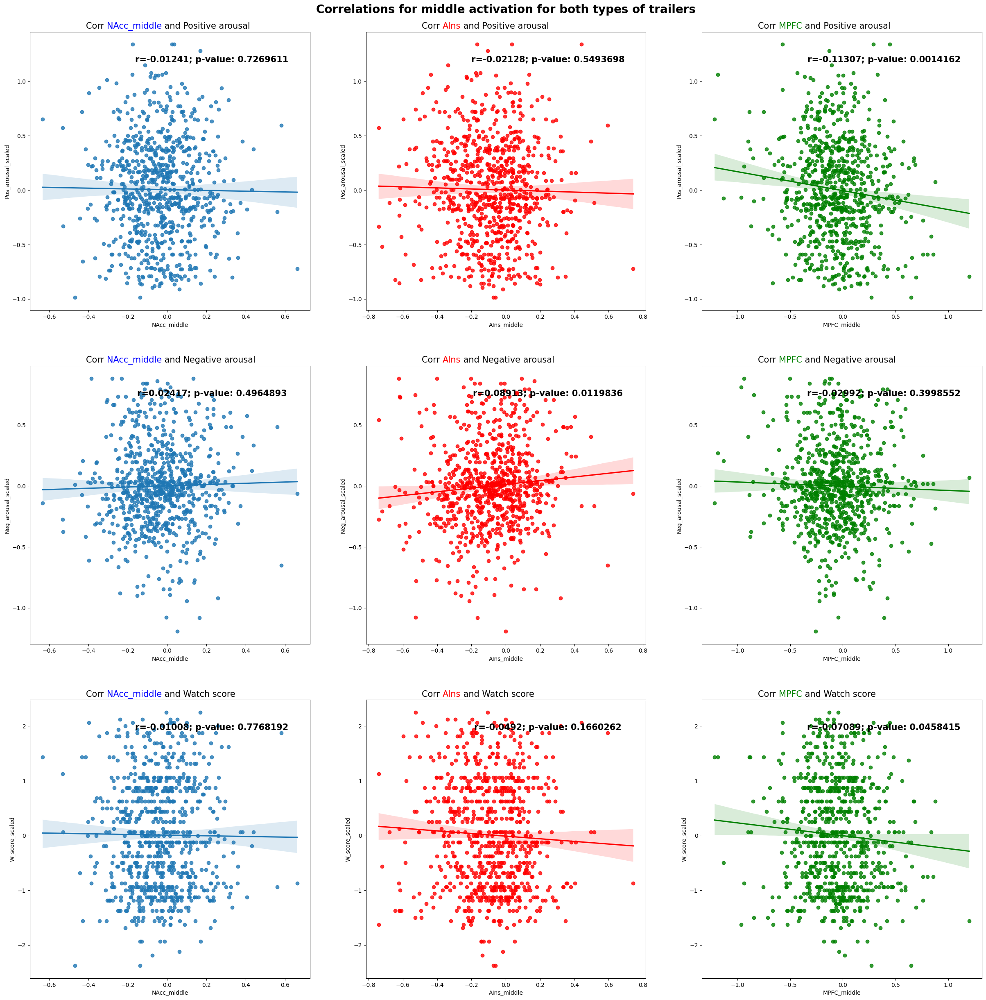

In [92]:
Mid_all_corr = [NAcc_PA_Mid_All_corr, NAcc_NA_Mid_All_corr, NAcc_W_Mid_All_corr, AIns_PA_Mid_All_corr, AIns_NA_Mid_All_corr, AIns_W_Mid_All_corr, MPFC_PA_Mid_All_corr, MPFC_NA_Mid_All_corr, MPFC_W_Mid_All_corr]
plot_correlations(all_subs_events_df, Mid_all_corr, "middle", "Correlations for middle activation for both types of trailers")

In [93]:
# Middle Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_Mid_C_corr = pearsonr(all_subs_events_comedy["NAcc_middle"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_Mid_C_corr = pearsonr(all_subs_events_comedy["AIns_middle"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_Mid_C_corr = pearsonr(all_subs_events_comedy["MPFC_middle"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_Mid_C_corr = pearsonr(all_subs_events_comedy["NAcc_middle"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_Mid_C_corr = pearsonr(all_subs_events_comedy["AIns_middle"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_Mid_C_corr = pearsonr(all_subs_events_comedy["MPFC_middle"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_Mid_C_corr = pearsonr(all_subs_events_comedy["NAcc_middle"], all_subs_events_comedy["W_score_scaled"])
AIns_W_Mid_C_corr = pearsonr(all_subs_events_comedy["AIns_middle"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_Mid_C_corr = pearsonr(all_subs_events_comedy["MPFC_middle"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc middle activation and positive arousal is: " + str(round(NAcc_PA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Mid_C_corr[1])))
print("For comedy trailers, the correlation between AIns middle activation and positive arousal is: " + str(round(AIns_PA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Mid_C_corr[1])))
print("For comedy trailers, the correlation between MPFC middle activation and positive arousal is: " + str(round(MPFC_PA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Mid_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc middle activation and negative arousal is: " + str(round(NAcc_NA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Mid_C_corr[1])))
print("For comedy trailers, the correlation between AIns middle activation and negative arousal is: " + str(round(AIns_NA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Mid_C_corr[1])))
print("For comedy trailers, the correlation between MPFC middle activation and negative arousal is: " + str(round(MPFC_NA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Mid_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc middle activation and watch scores is: " + str(round(NAcc_W_Mid_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Mid_C_corr[1])))
print("For comedy trailers, the correlation between AIns middle activation and watch scores is: " + str(round(AIns_W_Mid_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Mid_C_corr[1])))
print("For comedy trailers, the correlation between MPFC middle activation and watch scores is: " + str(round(MPFC_W_Mid_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Mid_C_corr[1])))


For comedy trailers, the correlation between NAcc middle activation and positive arousal is: -0.0295 with a p-value of: 0.5568573795985354
For comedy trailers, the correlation between AIns middle activation and positive arousal is: -0.04825 with a p-value of: 0.33637207791097773
For comedy trailers, the correlation between MPFC middle activation and positive arousal is: -0.12328 with a p-value of: 0.01372952749668202

For comedy trailers, the correlation between NAcc middle activation and negative arousal is: 0.0133 with a p-value of: 0.7910939189110486
For comedy trailers, the correlation between AIns middle activation and negative arousal is: 0.08989 with a p-value of: 0.07288896174596383
For comedy trailers, the correlation between MPFC middle activation and negative arousal is: -0.01181 with a p-value of: 0.8140107150510408

For comedy trailers, the correlation between NAcc middle activation and watch scores is: -0.01839 with a p-value of: 0.7141877368141902
For comedy trailers, th

In [94]:
# Middle Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_Mid_H_corr = pearsonr(all_subs_events_horror["NAcc_middle"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_Mid_H_corr = pearsonr(all_subs_events_horror["AIns_middle"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_Mid_H_corr = pearsonr(all_subs_events_horror["MPFC_middle"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_Mid_H_corr = pearsonr(all_subs_events_horror["NAcc_middle"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_Mid_H_corr = pearsonr(all_subs_events_horror["AIns_middle"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_Mid_H_corr = pearsonr(all_subs_events_horror["MPFC_middle"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_Mid_H_corr = pearsonr(all_subs_events_horror["NAcc_middle"], all_subs_events_horror["W_score_scaled"])
AIns_W_Mid_H_corr = pearsonr(all_subs_events_horror["AIns_middle"], all_subs_events_horror["W_score_scaled"])
MPFC_W_Mid_H_corr = pearsonr(all_subs_events_horror["MPFC_middle"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc middle activation and positive arousal is: " + str(round(NAcc_PA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Mid_H_corr[1])))
print("For horror trailers, the correlation between AIns middle activation and positive arousal is: " + str(round(AIns_PA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Mid_H_corr[1])))
print("For horror trailers, the correlation between MPFC middle activation and positive arousal is: " + str(round(MPFC_PA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Mid_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc middle activation and negative arousal is: " + str(round(NAcc_NA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Mid_H_corr[1])))
print("For horror trailers, the correlation between AIns middle activation and negative arousal is: " + str(round(AIns_NA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Mid_H_corr[1])))
print("For horror trailers, the correlation between MPFC middle activation and negative arousal is: " + str(round(MPFC_NA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Mid_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc middle activation and watch scores is: " + str(round(NAcc_W_Mid_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Mid_H_corr[1])))
print("For horror trailers, the correlation between AIns middle activation and watch scores is: " + str(round(AIns_W_Mid_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Mid_H_corr[1])))
print("For horror trailers, the correlation between MPFC middle activation and watch scores is: " + str(round(MPFC_W_Mid_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Mid_H_corr[1])))

For horror trailers, the correlation between NAcc middle activation and positive arousal is: 0.00796 with a p-value of: 0.8746214237490757
For horror trailers, the correlation between AIns middle activation and positive arousal is: -0.00191 with a p-value of: 0.9698400551811328
For horror trailers, the correlation between MPFC middle activation and positive arousal is: -0.10213 with a p-value of: 0.04248817401180693

For horror trailers, the correlation between NAcc middle activation and negative arousal is: 0.02525 with a p-value of: 0.6168035114554803
For horror trailers, the correlation between AIns middle activation and negative arousal is: -0.04302 with a p-value of: 0.39379331697917636
For horror trailers, the correlation between MPFC middle activation and negative arousal is: -0.04815 with a p-value of: 0.3398093881071614

For horror trailers, the correlation between NAcc middle activation and watch scores is: 0.00648 with a p-value of: 0.8978113046226504
For horror trailers, th

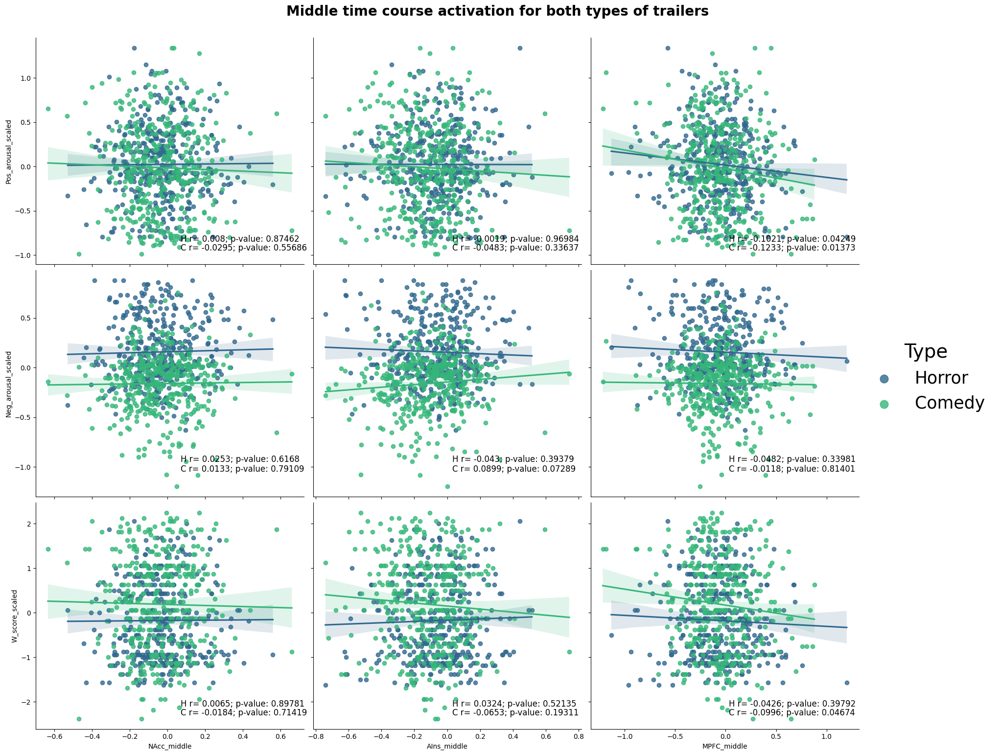

In [95]:
Mid_horror_corr = [NAcc_PA_Mid_H_corr, NAcc_NA_Mid_H_corr, NAcc_W_Mid_H_corr, AIns_PA_Mid_H_corr, AIns_NA_Mid_H_corr, AIns_W_Mid_H_corr, MPFC_PA_Mid_H_corr, MPFC_NA_Mid_H_corr, MPFC_W_Mid_H_corr]
Mid_comedy_corr = [NAcc_PA_Mid_C_corr, NAcc_NA_Mid_C_corr, NAcc_W_Mid_C_corr, AIns_PA_Mid_C_corr, AIns_NA_Mid_C_corr, AIns_W_Mid_C_corr, MPFC_PA_Mid_C_corr, MPFC_NA_Mid_C_corr, MPFC_W_Mid_C_corr]

title_middle = 'Middle time course activation for both types of trailers'
plot_correlations3_bothTrailers(all_subs_events_df, "middle", Mid_comedy_corr, Mid_horror_corr, title_middle)

## Neural activation onset

In [96]:
# Correlation with Positive Arousal.
NAcc_PA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["W_score_scaled"])
AIns_W_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["W_score_scaled"])
MPFC_W_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_All_corr[1])))
print("For both types of trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_All_corr[1])))
print("For both types of trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_All_corr[1])))
print("For both types of trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_All_corr[1])))
print("For both types of trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_All_corr[1])))
print("For both types of trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_All_corr[1])))
print("For both types of trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_All_corr[1])))

For both types of trailers, the correlation between NAcc onset activation and positive arousal is: 0.00426 with a p-value of: 0.9046319769159918
For both types of trailers, the correlation between AIns onset activation and positive arousal is: 0.03054 with a p-value of: 0.39007834778122036
For both types of trailers, the correlation between MPFC onset activation and positive arousal is: 0.01651 with a p-value of: 0.6423578409916301

For both types of trailers, the correlation between NAcc onset activation and negative arousal is: 2e-05 with a p-value of: 0.9995531814693152
For both types of trailers, the correlation between AIns onset activation and negative arousal is: 0.01529 with a p-value of: 0.6671057421155281
For both types of trailers, the correlation between MPFC onset activation and negative arousal is: -0.01151 with a p-value of: 0.7461160831292208

For both types of trailers, the correlation between NAcc onset activation and watch scores is: 0.00723 with a p-value of: 0.8388

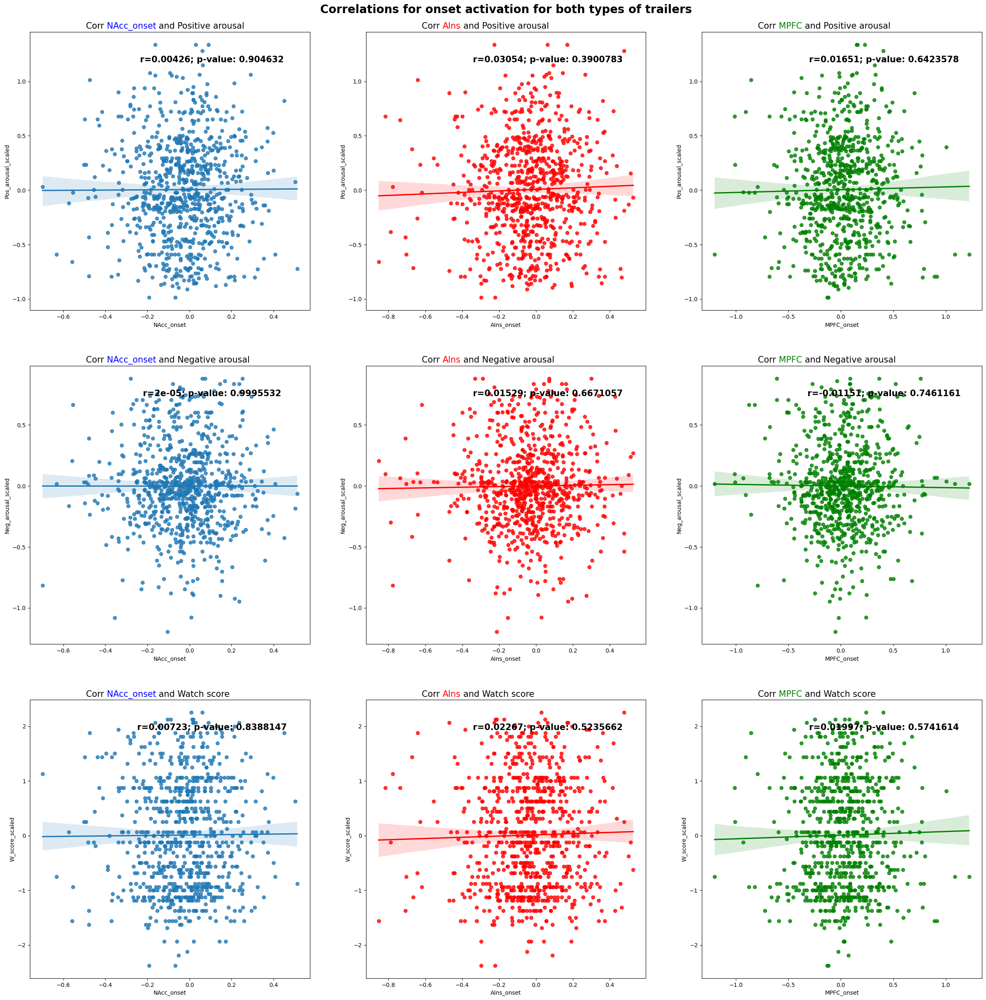

In [97]:
On_all_corr = [NAcc_PA_On_All_corr, NAcc_NA_On_All_corr, NAcc_W_On_All_corr, AIns_PA_On_All_corr, AIns_NA_On_All_corr, AIns_W_On_All_corr, MPFC_PA_On_All_corr, MPFC_NA_On_All_corr, MPFC_W_On_All_corr]
plot_correlations(all_subs_events_df, On_all_corr, "onset", "Correlations for onset activation for both types of trailers")

In [98]:
# Onset Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["W_score_scaled"])
AIns_W_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_C_corr[1])))
print("For comedy trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_C_corr[1])))
print("For comedy trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_C_corr[1])))
print("For comedy trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_C_corr[1])))
print("For comedy trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_C_corr[1])))
print("For comedy trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_C_corr[1])))
print("For comedy trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_C_corr[1])))

For comedy trailers, the correlation between NAcc onset activation and positive arousal is: 0.04912 with a p-value of: 0.3276886896855176
For comedy trailers, the correlation between AIns onset activation and positive arousal is: 0.04245 with a p-value of: 0.3977778049103402
For comedy trailers, the correlation between MPFC onset activation and positive arousal is: -0.01174 with a p-value of: 0.8151364087998897

For comedy trailers, the correlation between NAcc onset activation and negative arousal is: 0.03345 with a p-value of: 0.5052482552710391
For comedy trailers, the correlation between AIns onset activation and negative arousal is: 0.02089 with a p-value of: 0.6773875246573825
For comedy trailers, the correlation between MPFC onset activation and negative arousal is: 0.05246 with a p-value of: 0.29591460158493665

For comedy trailers, the correlation between NAcc onset activation and watch scores is: 0.02729 with a p-value of: 0.586811153349212
For comedy trailers, the correlatio

In [99]:
# Onset Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["W_score_scaled"])
AIns_W_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["W_score_scaled"])
MPFC_W_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_H_corr[1])))
print("For horror trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_H_corr[1])))
print("For horror trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_H_corr[1])))
print("For horror trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_H_corr[1])))
print("For horror trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_H_corr[1])))
print("For horror trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_H_corr[1])))
print("For horror trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_H_corr[1])))

For horror trailers, the correlation between NAcc onset activation and positive arousal is: -0.04853 with a p-value of: 0.33607792093997446
For horror trailers, the correlation between AIns onset activation and positive arousal is: 0.01317 with a p-value of: 0.7942038464242206
For horror trailers, the correlation between MPFC onset activation and positive arousal is: 0.05509 with a p-value of: 0.2747179028069025

For horror trailers, the correlation between NAcc onset activation and negative arousal is: -0.01116 with a p-value of: 0.8250336919902977
For horror trailers, the correlation between AIns onset activation and negative arousal is: -0.02511 with a p-value of: 0.6187688598797958
For horror trailers, the correlation between MPFC onset activation and negative arousal is: -0.02663 with a p-value of: 0.5976928042097502

For horror trailers, the correlation between NAcc onset activation and watch scores is: -0.02478 with a p-value of: 0.6234376884613623
For horror trailers, the corre

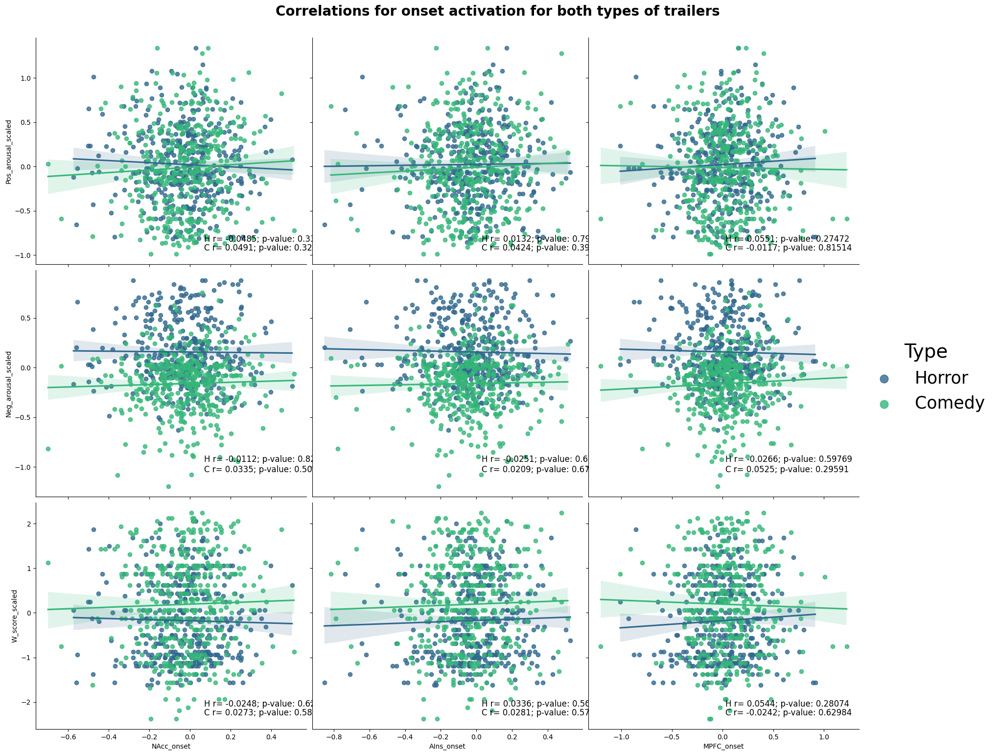

In [100]:
On_horror_corr = [NAcc_PA_On_H_corr, NAcc_NA_On_H_corr, NAcc_W_On_H_corr, AIns_PA_On_H_corr, AIns_NA_On_H_corr, AIns_W_On_H_corr, MPFC_PA_On_H_corr, MPFC_NA_On_H_corr, MPFC_W_On_H_corr]
On_comedy_corr = [NAcc_PA_On_C_corr, NAcc_NA_On_C_corr, NAcc_W_On_C_corr, AIns_PA_On_C_corr, AIns_NA_On_C_corr, AIns_W_On_C_corr, MPFC_PA_On_C_corr, MPFC_NA_On_C_corr, MPFC_W_On_C_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "onset", On_comedy_corr, On_horror_corr, "Correlations for onset activation for both types of trailers")



## Peak Max

In [101]:
# Correlation with Positive Arousal.
NAcc_PA_Pmax_All_corr = pearsonr(all_subs_events_df["NAcc_pos_peak"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Pmax_All_corr = pearsonr(all_subs_events_df["AIns_pos_peak"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Pmax_All_corr = pearsonr(all_subs_events_df["MPFC_pos_peak"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Pmax_All_corr = pearsonr(all_subs_events_df["NAcc_pos_peak"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Pmax_All_corr = pearsonr(all_subs_events_df["AIns_pos_peak"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Pmax_All_corr = pearsonr(all_subs_events_df["MPFC_pos_peak"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Pmax_All_corr = pearsonr(all_subs_events_df["NAcc_pos_peak"], all_subs_events_df["W_score_scaled"])
AIns_W_Pmax_All_corr = pearsonr(all_subs_events_df["AIns_pos_peak"], all_subs_events_df["W_score_scaled"])
MPFC_W_Pmax_All_corr = pearsonr(all_subs_events_df["MPFC_pos_peak"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc positive peak activation and positive arousal is: " + str(round(NAcc_PA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between AIns positive peak activation and positive arousal is: " + str(round(AIns_PA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between MPFC positive peak activation and positive arousal is: " + str(round(MPFC_PA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmax_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc positive peak activation and negative arousal is: " + str(round(NAcc_NA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between AIns positive peak activation and negative arousal is: " + str(round(AIns_NA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between MPFC positive peak activation and negative arousal is: " + str(round(MPFC_NA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmax_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc positive peak activation and watch scores is: " + str(round(NAcc_W_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between AIns positive peak activation and watch scores is: " + str(round(AIns_W_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between MPFC positive peak activation and watch scores is: " + str(round(MPFC_W_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmax_All_corr[1])))
      



For both types of trailers, the correlation between NAcc positive peak activation and positive arousal is: 0.00533 with a p-value of: 0.8808451009929318
For both types of trailers, the correlation between AIns positive peak activation and positive arousal is: 0.00097 with a p-value of: 0.9782431028214311
For both types of trailers, the correlation between MPFC positive peak activation and positive arousal is: -0.06196 with a p-value of: 0.08099084702409806

For both types of trailers, the correlation between NAcc positive peak activation and negative arousal is: 3e-05 with a p-value of: 0.9993685963655159
For both types of trailers, the correlation between AIns positive peak activation and negative arousal is: 0.10975 with a p-value of: 0.0019548332547653807
For both types of trailers, the correlation between MPFC positive peak activation and negative arousal is: 0.02039 with a p-value of: 0.5662057451482315

For both types of trailers, the correlation between NAcc positive peak activa

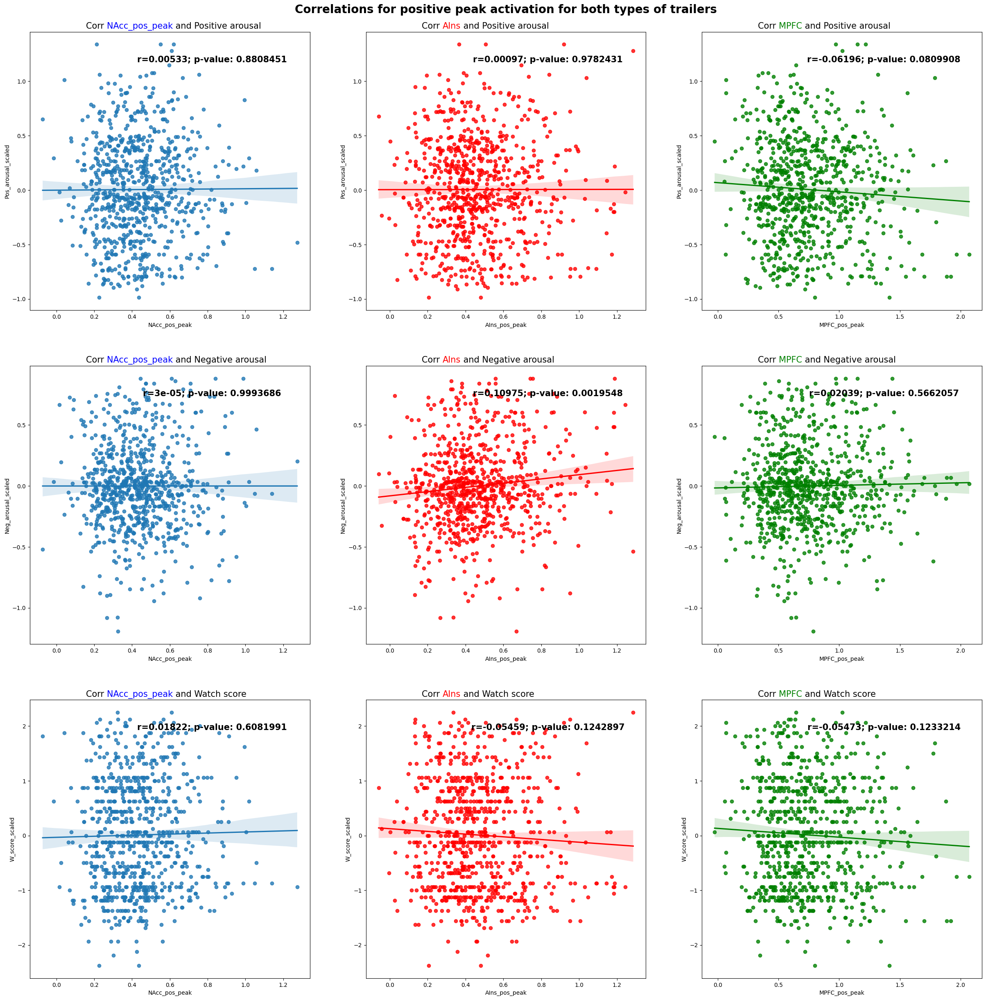

In [102]:
Pmax_all_corr = [NAcc_PA_Pmax_All_corr, NAcc_NA_Pmax_All_corr, NAcc_W_Pmax_All_corr, AIns_PA_Pmax_All_corr, AIns_NA_Pmax_All_corr, AIns_W_Pmax_All_corr, MPFC_PA_Pmax_All_corr, MPFC_NA_Pmax_All_corr, MPFC_W_Pmax_All_corr]
plot_correlations(all_subs_events_df, Pmax_all_corr, "pos_peak", "Correlations for positive peak activation for both types of trailers")


In [103]:
# Pos peak Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_Pmax_C_corr = pearsonr(all_subs_events_comedy["NAcc_pos_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_Pmax_C_corr = pearsonr(all_subs_events_comedy["AIns_pos_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_Pmax_C_corr = pearsonr(all_subs_events_comedy["MPFC_pos_peak"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_Pmax_C_corr = pearsonr(all_subs_events_comedy["NAcc_pos_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_Pmax_C_corr = pearsonr(all_subs_events_comedy["AIns_pos_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_Pmax_C_corr = pearsonr(all_subs_events_comedy["MPFC_pos_peak"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_Pmax_C_corr = pearsonr(all_subs_events_comedy["NAcc_pos_peak"], all_subs_events_comedy["W_score_scaled"])
AIns_W_Pmax_C_corr = pearsonr(all_subs_events_comedy["AIns_pos_peak"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_Pmax_C_corr = pearsonr(all_subs_events_comedy["MPFC_pos_peak"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc positive peak activation and positive arousal is: " + str(round(NAcc_PA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between AIns positive peak activation and positive arousal is: " + str(round(AIns_PA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between MPFC positive peak activation and positive arousal is: " + str(round(MPFC_PA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmax_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc positive peak activation and negative arousal is: " + str(round(NAcc_NA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between AIns positive peak activation and negative arousal is: " + str(round(AIns_NA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between MPFC positive peak activation and negative arousal is: " + str(round(MPFC_NA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmax_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc positive peak activation and watch scores is: " + str(round(NAcc_W_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between AIns positive peak activation and watch scores is: " + str(round(AIns_W_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between MPFC positive peak activation and watch scores is: " + str(round(MPFC_W_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmax_C_corr[1])))
      
      


For comedy trailers, the correlation between NAcc positive peak activation and positive arousal is: 0.02433 with a p-value of: 0.6280204636915998
For comedy trailers, the correlation between AIns positive peak activation and positive arousal is: 0.00044 with a p-value of: 0.9930342928170989
For comedy trailers, the correlation between MPFC positive peak activation and positive arousal is: -0.05607 with a p-value of: 0.2638019765574258

For comedy trailers, the correlation between NAcc positive peak activation and negative arousal is: -0.09005 with a p-value of: 0.07235945716752815
For comedy trailers, the correlation between AIns positive peak activation and negative arousal is: 0.01372 with a p-value of: 0.7847316275713805
For comedy trailers, the correlation between MPFC positive peak activation and negative arousal is: 0.05234 with a p-value of: 0.29701776281761394

For comedy trailers, the correlation between NAcc positive peak activation and watch scores is: 0.07477 with a p-value

In [104]:
# Pos peak Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_Pmax_H_corr = pearsonr(all_subs_events_horror["NAcc_pos_peak"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_Pmax_H_corr = pearsonr(all_subs_events_horror["AIns_pos_peak"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_Pmax_H_corr = pearsonr(all_subs_events_horror["MPFC_pos_peak"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_Pmax_H_corr = pearsonr(all_subs_events_horror["NAcc_pos_peak"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_Pmax_H_corr = pearsonr(all_subs_events_horror["AIns_pos_peak"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_Pmax_H_corr = pearsonr(all_subs_events_horror["MPFC_pos_peak"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_Pmax_H_corr = pearsonr(all_subs_events_horror["NAcc_pos_peak"], all_subs_events_horror["W_score_scaled"])
AIns_W_Pmax_H_corr = pearsonr(all_subs_events_horror["AIns_pos_peak"], all_subs_events_horror["W_score_scaled"])
MPFC_W_Pmax_H_corr = pearsonr(all_subs_events_horror["MPFC_pos_peak"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc positive peak activation and positive arousal is: " + str(round(NAcc_PA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmax_H_corr[1])))
print("For horror trailers, the correlation between AIns positive peak activation and positive arousal is: " + str(round(AIns_PA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmax_H_corr[1])))
print("For horror trailers, the correlation between MPFC positive peak activation and positive arousal is: " + str(round(MPFC_PA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmax_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc positive peak activation and negative arousal is: " + str(round(NAcc_NA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmax_H_corr[1])))
print("For horror trailers, the correlation between AIns positive peak activation and negative arousal is: " + str(round(AIns_NA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmax_H_corr[1])))
print("For horror trailers, the correlation between MPFC positive peak activation and negative arousal is: " + str(round(MPFC_NA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmax_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc positive peak activation and watch scores is: " + str(round(NAcc_W_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmax_H_corr[1])))
print("For horror trailers, the correlation between AIns positive peak activation and watch scores is: " + str(round(AIns_W_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmax_H_corr[1])))
print("For horror trailers, the correlation between MPFC positive peak activation and watch scores is: " + str(round(MPFC_W_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmax_H_corr[1])))


For horror trailers, the correlation between NAcc positive peak activation and positive arousal is: -0.01686 with a p-value of: 0.7383745544309085
For horror trailers, the correlation between AIns positive peak activation and positive arousal is: -0.00759 with a p-value of: 0.8804223289421984
For horror trailers, the correlation between MPFC positive peak activation and positive arousal is: -0.06806 with a p-value of: 0.17701622861705638

For horror trailers, the correlation between NAcc positive peak activation and negative arousal is: 0.08958 with a p-value of: 0.07536950725001051
For horror trailers, the correlation between AIns positive peak activation and negative arousal is: 0.11983 with a p-value of: 0.017190823401208595
For horror trailers, the correlation between MPFC positive peak activation and negative arousal is: 0.0179 with a p-value of: 0.7229091764196921

For horror trailers, the correlation between NAcc positive peak activation and watch scores is: -0.05114 with a p-va

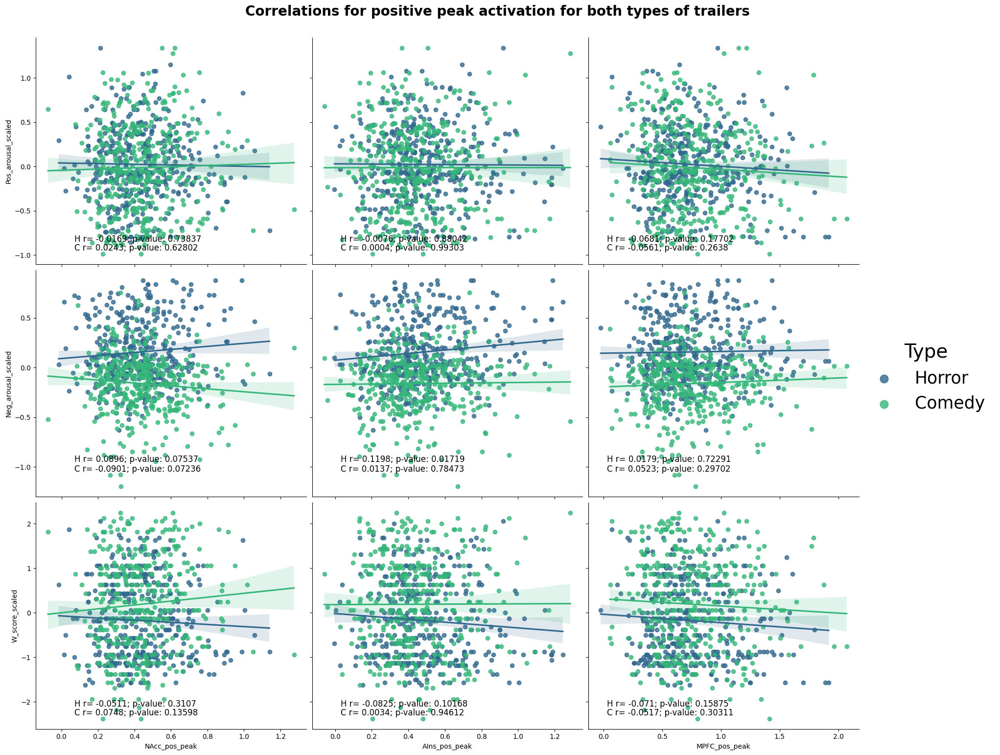

In [105]:
Pmax_comedy_corr = [NAcc_PA_Pmax_C_corr, NAcc_NA_Pmax_C_corr, NAcc_W_Pmax_C_corr, AIns_PA_Pmax_C_corr, AIns_NA_Pmax_C_corr, AIns_W_Pmax_C_corr, MPFC_PA_Pmax_C_corr, MPFC_NA_Pmax_C_corr, MPFC_W_Pmax_C_corr]
Pmax_horror_corr = [NAcc_PA_Pmax_H_corr, NAcc_NA_Pmax_H_corr, NAcc_W_Pmax_H_corr, AIns_PA_Pmax_H_corr, AIns_NA_Pmax_H_corr, AIns_W_Pmax_H_corr, MPFC_PA_Pmax_H_corr, MPFC_NA_Pmax_H_corr, MPFC_W_Pmax_H_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "pos_peak", Pmax_comedy_corr, Pmax_horror_corr, "Correlations for positive peak activation for both types of trailers")

## Peak min

In [106]:
# Correlation with Positive Arousal.
NAcc_PA_Pmin_All_corr = pearsonr(all_subs_events_df["NAcc_neg_peak"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Pmin_All_corr = pearsonr(all_subs_events_df["AIns_neg_peak"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Pmin_All_corr = pearsonr(all_subs_events_df["MPFC_neg_peak"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Pmin_All_corr = pearsonr(all_subs_events_df["NAcc_neg_peak"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Pmin_All_corr = pearsonr(all_subs_events_df["AIns_neg_peak"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Pmin_All_corr = pearsonr(all_subs_events_df["MPFC_neg_peak"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Pmin_All_corr = pearsonr(all_subs_events_df["NAcc_neg_peak"], all_subs_events_df["W_score_scaled"])
AIns_W_Pmin_All_corr = pearsonr(all_subs_events_df["AIns_neg_peak"], all_subs_events_df["W_score_scaled"])
MPFC_W_Pmin_All_corr = pearsonr(all_subs_events_df["MPFC_neg_peak"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc negative peak activation and positive arousal is: " + str(round(NAcc_PA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between AIns negative peak activation and positive arousal is: " + str(round(AIns_PA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between MPFC negative peak activation and positive arousal is: " + str(round(MPFC_PA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmin_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc negative peak activation and negative arousal is: " + str(round(NAcc_NA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between AIns negative peak activation and negative arousal is: " + str(round(AIns_NA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between MPFC negative peak activation and negative arousal is: " + str(round(MPFC_NA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmin_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc negative peak activation and watch scores is: " + str(round(NAcc_W_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between AIns negative peak activation and watch scores is: " + str(round(AIns_W_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between MPFC negative peak activation and watch scores is: " + str(round(MPFC_W_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmin_All_corr[1])))
      
      

For both types of trailers, the correlation between NAcc negative peak activation and positive arousal is: 0.04631 with a p-value of: 0.19240570582151806
For both types of trailers, the correlation between AIns negative peak activation and positive arousal is: 0.02417 with a p-value of: 0.49644707509395436
For both types of trailers, the correlation between MPFC negative peak activation and positive arousal is: 0.01247 with a p-value of: 0.7257667427308772

For both types of trailers, the correlation between NAcc negative peak activation and negative arousal is: -0.01713 with a p-value of: 0.6298610844938608
For both types of trailers, the correlation between AIns negative peak activation and negative arousal is: 0.05419 with a p-value of: 0.12708156737447832
For both types of trailers, the correlation between MPFC negative peak activation and negative arousal is: -0.04167 with a p-value of: 0.24087852697745182

For both types of trailers, the correlation between NAcc negative peak act

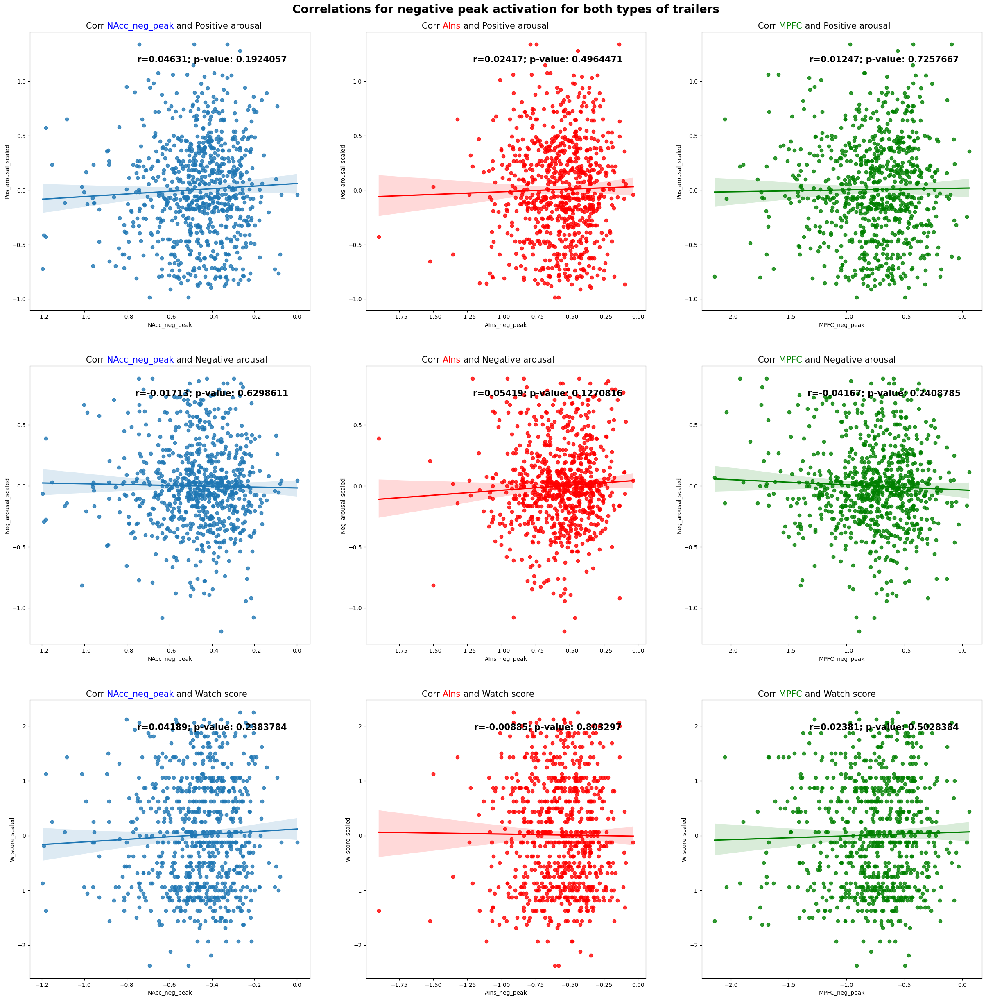

In [107]:
Pmin_all_corr = [NAcc_PA_Pmin_All_corr, NAcc_NA_Pmin_All_corr, NAcc_W_Pmin_All_corr, AIns_PA_Pmin_All_corr, AIns_NA_Pmin_All_corr, AIns_W_Pmin_All_corr, MPFC_PA_Pmin_All_corr, MPFC_NA_Pmin_All_corr, MPFC_W_Pmin_All_corr]
plot_correlations(all_subs_events_df, Pmin_all_corr, "neg_peak", "Correlations for negative peak activation for both types of trailers")

In [108]:
# Neg peak Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_Pmin_C_corr = pearsonr(all_subs_events_comedy["NAcc_neg_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_Pmin_C_corr = pearsonr(all_subs_events_comedy["AIns_neg_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_Pmin_C_corr = pearsonr(all_subs_events_comedy["MPFC_neg_peak"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_Pmin_C_corr = pearsonr(all_subs_events_comedy["NAcc_neg_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_Pmin_C_corr = pearsonr(all_subs_events_comedy["AIns_neg_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_Pmin_C_corr = pearsonr(all_subs_events_comedy["MPFC_neg_peak"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_Pmin_C_corr = pearsonr(all_subs_events_comedy["NAcc_neg_peak"], all_subs_events_comedy["W_score_scaled"])
AIns_W_Pmin_C_corr = pearsonr(all_subs_events_comedy["AIns_neg_peak"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_Pmin_C_corr = pearsonr(all_subs_events_comedy["MPFC_neg_peak"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc negative peak activation and positive arousal is: " + str(round(NAcc_PA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between AIns negative peak activation and positive arousal is: " + str(round(AIns_PA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between MPFC negative peak activation and positive arousal is: " + str(round(MPFC_PA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmin_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc negative peak activation and negative arousal is: " + str(round(NAcc_NA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between AIns negative peak activation and negative arousal is: " + str(round(AIns_NA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between MPFC negative peak activation and negative arousal is: " + str(round(MPFC_NA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmin_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc negative peak activation and watch scores is: " + str(round(NAcc_W_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between AIns negative peak activation and watch scores is: " + str(round(AIns_W_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between MPFC negative peak activation and watch scores is: " + str(round(MPFC_W_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmin_C_corr[1])))


For comedy trailers, the correlation between NAcc negative peak activation and positive arousal is: -0.03343 with a p-value of: 0.5054571079688358
For comedy trailers, the correlation between AIns negative peak activation and positive arousal is: -0.00964 with a p-value of: 0.8477006431386614
For comedy trailers, the correlation between MPFC negative peak activation and positive arousal is: -0.04809 with a p-value of: 0.3380292199114826

For comedy trailers, the correlation between NAcc negative peak activation and negative arousal is: 0.09497 with a p-value of: 0.05805714699337845
For comedy trailers, the correlation between AIns negative peak activation and negative arousal is: 0.09523 with a p-value of: 0.05734714359921761
For comedy trailers, the correlation between MPFC negative peak activation and negative arousal is: -0.01278 with a p-value of: 0.7991758685439904

For comedy trailers, the correlation between NAcc negative peak activation and watch scores is: -0.06924 with a p-va

In [109]:
# Neg peak Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_Pmin_H_corr = pearsonr(all_subs_events_horror["NAcc_neg_peak"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_Pmin_H_corr = pearsonr(all_subs_events_horror["AIns_neg_peak"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_Pmin_H_corr = pearsonr(all_subs_events_horror["MPFC_neg_peak"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_Pmin_H_corr = pearsonr(all_subs_events_horror["NAcc_neg_peak"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_Pmin_H_corr = pearsonr(all_subs_events_horror["AIns_neg_peak"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_Pmin_H_corr = pearsonr(all_subs_events_horror["MPFC_neg_peak"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_Pmin_H_corr = pearsonr(all_subs_events_horror["NAcc_neg_peak"], all_subs_events_horror["W_score_scaled"])
AIns_W_Pmin_H_corr = pearsonr(all_subs_events_horror["AIns_neg_peak"], all_subs_events_horror["W_score_scaled"])
MPFC_W_Pmin_H_corr = pearsonr(all_subs_events_horror["MPFC_neg_peak"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc negative peak activation and positive arousal is: " + str(round(NAcc_PA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmin_H_corr[1])))
print("For horror trailers, the correlation between AIns negative peak activation and positive arousal is: " + str(round(AIns_PA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmin_H_corr[1])))
print("For horror trailers, the correlation between MPFC negative peak activation and positive arousal is: " + str(round(MPFC_PA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmin_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc negative peak activation and negative arousal is: " + str(round(NAcc_NA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmin_H_corr[1])))
print("For horror trailers, the correlation between AIns negative peak activation and negative arousal is: " + str(round(AIns_NA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmin_H_corr[1])))
print("For horror trailers, the correlation between MPFC negative peak activation and negative arousal is: " + str(round(MPFC_NA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmin_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc negative peak activation and watch scores is: " + str(round(NAcc_W_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmin_H_corr[1])))
print("For horror trailers, the correlation between AIns negative peak activation and watch scores is: " + str(round(AIns_W_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmin_H_corr[1])))
print("For horror trailers, the correlation between MPFC negative peak activation and watch scores is: " + str(round(MPFC_W_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmin_H_corr[1])))
      

For horror trailers, the correlation between NAcc negative peak activation and positive arousal is: 0.14497 with a p-value of: 0.0038856579146709686
For horror trailers, the correlation between AIns negative peak activation and positive arousal is: 0.05584 with a p-value of: 0.2682031264740859
For horror trailers, the correlation between MPFC negative peak activation and positive arousal is: 0.08328 with a p-value of: 0.09838819583206913

For horror trailers, the correlation between NAcc negative peak activation and negative arousal is: -0.06558 with a p-value of: 0.19340923572667312
For horror trailers, the correlation between AIns negative peak activation and negative arousal is: -0.06915 with a p-value of: 0.1702116314365829
For horror trailers, the correlation between MPFC negative peak activation and negative arousal is: -0.08149 with a p-value of: 0.10586084072482663

For horror trailers, the correlation between NAcc negative peak activation and watch scores is: 0.14913 with a p-

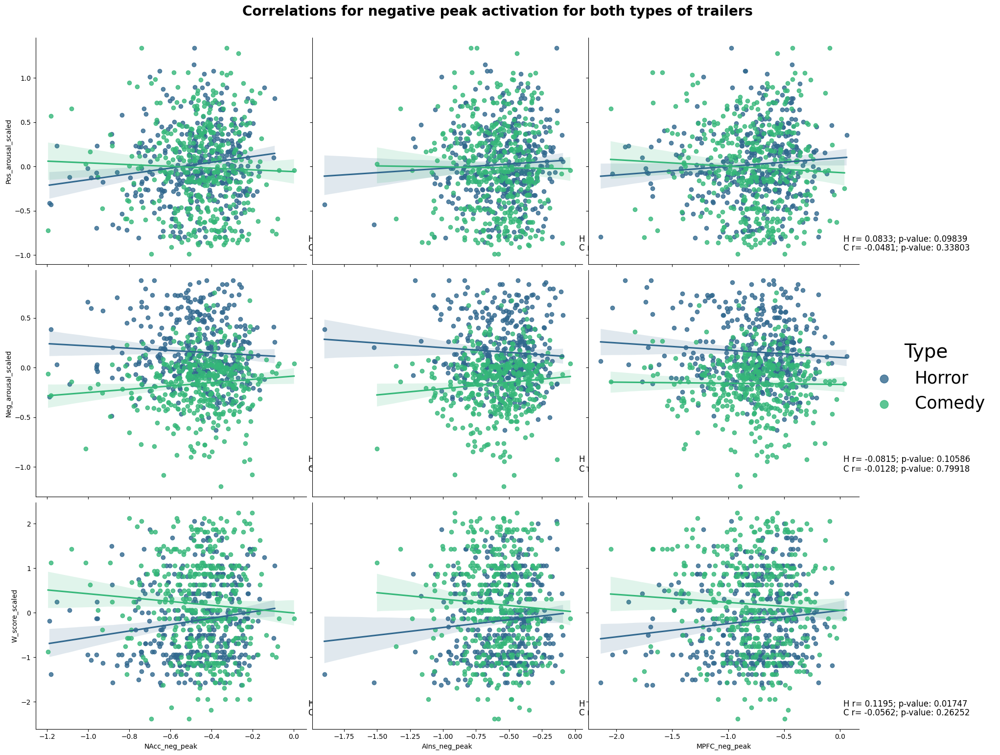

In [110]:
Pmin_comedy_corr = [NAcc_PA_Pmin_C_corr, NAcc_NA_Pmin_C_corr, NAcc_W_Pmin_C_corr, AIns_PA_Pmin_C_corr, AIns_NA_Pmin_C_corr, AIns_W_Pmin_C_corr, MPFC_PA_Pmin_C_corr, MPFC_NA_Pmin_C_corr, MPFC_W_Pmin_C_corr]
Pmin_horror_corr = [NAcc_PA_Pmin_H_corr, NAcc_NA_Pmin_H_corr, NAcc_W_Pmin_H_corr, AIns_PA_Pmin_H_corr, AIns_NA_Pmin_H_corr, AIns_W_Pmin_H_corr, MPFC_PA_Pmin_H_corr, MPFC_NA_Pmin_H_corr, MPFC_W_Pmin_H_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "neg_peak", Pmin_comedy_corr, Pmin_horror_corr, "Correlations for negative peak activation for both types of trailers")

## Absolute peak 

In [111]:
# Correlation with Positive Arousal.
NAcc_PA_Pabs_All_corr = pearsonr(all_subs_events_df["NAcc_abs_peak"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Pabs_All_corr = pearsonr(all_subs_events_df["AIns_abs_peak"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Pabs_All_corr = pearsonr(all_subs_events_df["MPFC_abs_peak"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Pabs_All_corr = pearsonr(all_subs_events_df["NAcc_abs_peak"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Pabs_All_corr = pearsonr(all_subs_events_df["AIns_abs_peak"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Pabs_All_corr = pearsonr(all_subs_events_df["MPFC_abs_peak"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Pabs_All_corr = pearsonr(all_subs_events_df["NAcc_abs_peak"], all_subs_events_df["W_score_scaled"])
AIns_W_Pabs_All_corr = pearsonr(all_subs_events_df["AIns_abs_peak"], all_subs_events_df["W_score_scaled"])
MPFC_W_Pabs_All_corr = pearsonr(all_subs_events_df["MPFC_abs_peak"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc absolute peak activation and positive arousal is: " + str(round(NAcc_PA_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pabs_All_corr[1])))
print("For both types of trailers, the correlation between AIns absolute peak activation and positive arousal is: " + str(round(AIns_PA_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pabs_All_corr[1])))
print("For both types of trailers, the correlation between MPFC absolute peak activation and positive arousal is: " + str(round(MPFC_PA_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pabs_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc absolute peak activation and negative arousal is: " + str(round(NAcc_NA_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pabs_All_corr[1])))
print("For both types of trailers, the correlation between AIns absolute peak activation and negative arousal is: " + str(round(AIns_NA_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pabs_All_corr[1])))
print("For both types of trailers, the correlation between MPFC absolute peak activation and negative arousal is: " + str(round(MPFC_NA_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pabs_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc absolute peak activation and watch scores is: " + str(round(NAcc_W_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pabs_All_corr[1])))
print("For both types of trailers, the correlation between AIns absolute peak activation and watch scores is: " + str(round(AIns_W_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pabs_All_corr[1])))
print("For both types of trailers, the correlation between MPFC absolute peak activation and watch scores is: " + str(round(MPFC_W_Pabs_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pabs_All_corr[1])))

      

For both types of trailers, the correlation between NAcc absolute peak activation and positive arousal is: 0.05423 with a p-value of: 0.12680346873332016
For both types of trailers, the correlation between AIns absolute peak activation and positive arousal is: 0.03677 with a p-value of: 0.3006906989901815
For both types of trailers, the correlation between MPFC absolute peak activation and positive arousal is: -0.00348 with a p-value of: 0.9219803091508307

For both types of trailers, the correlation between NAcc absolute peak activation and negative arousal is: -0.01933 with a p-value of: 0.5864357034853612
For both types of trailers, the correlation between AIns absolute peak activation and negative arousal is: 0.06585 with a p-value of: 0.06364439389935568
For both types of trailers, the correlation between MPFC absolute peak activation and negative arousal is: -0.00374 with a p-value of: 0.9161664643702764

For both types of trailers, the correlation between NAcc absolute peak acti

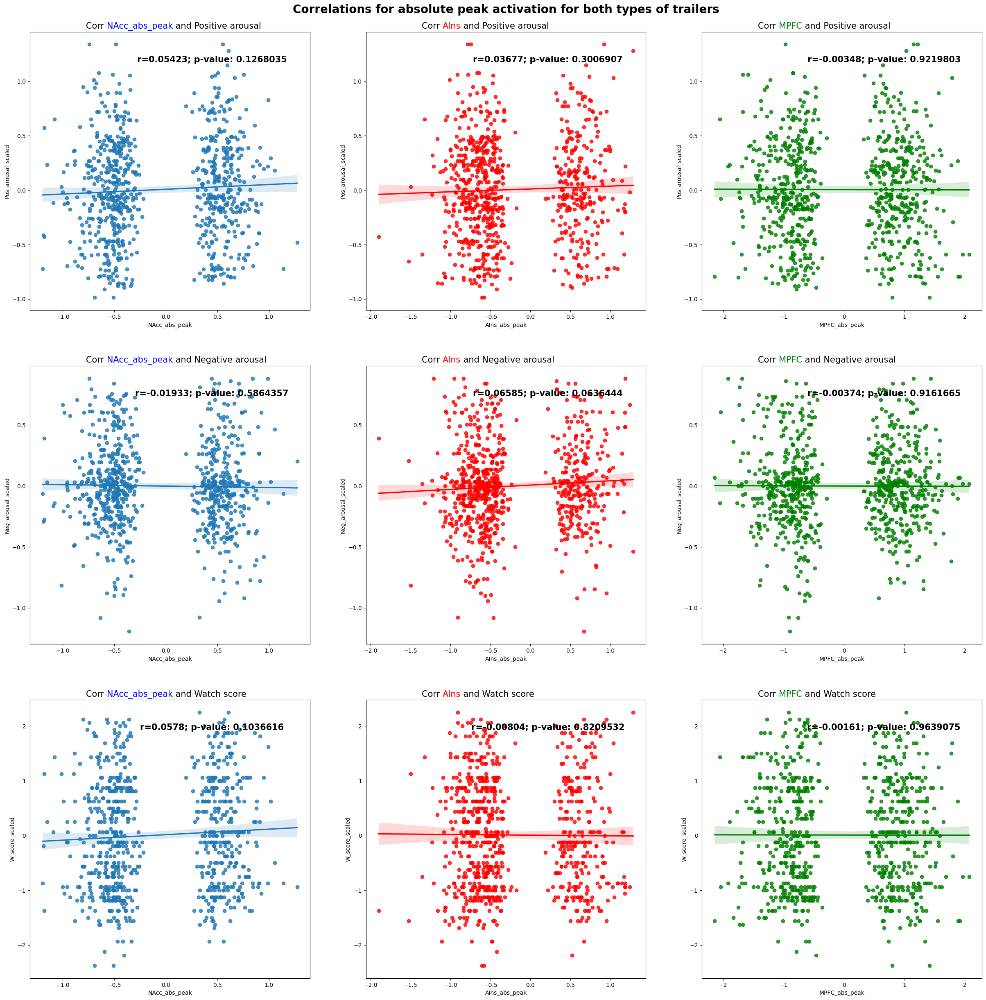

In [112]:
Pabs_all_corr = [NAcc_PA_Pabs_All_corr, NAcc_NA_Pabs_All_corr, NAcc_W_Pabs_All_corr, AIns_PA_Pabs_All_corr, AIns_NA_Pabs_All_corr, AIns_W_Pabs_All_corr, MPFC_PA_Pabs_All_corr, MPFC_NA_Pabs_All_corr, MPFC_W_Pabs_All_corr]
plot_correlations(all_subs_events_df, Pabs_all_corr, "abs_peak", "Correlations for absolute peak activation for both types of trailers")

In [113]:
NAcc_Pabs_comedy_corr = pearsonr(all_subs_events_comedy["NAcc_abs_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_Pabs_comedy_corr = pearsonr(all_subs_events_comedy["AIns_abs_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_Pabs_comedy_corr = pearsonr(all_subs_events_comedy["MPFC_abs_peak"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_Nabs_comedy_corr = pearsonr(all_subs_events_comedy["NAcc_abs_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_Nabs_comedy_corr = pearsonr(all_subs_events_comedy["AIns_abs_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_Nabs_comedy_corr = pearsonr(all_subs_events_comedy["MPFC_abs_peak"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_Wabs_comedy_corr = pearsonr(all_subs_events_comedy["NAcc_abs_peak"], all_subs_events_comedy["W_score_scaled"])
AIns_Wabs_comedy_corr = pearsonr(all_subs_events_comedy["AIns_abs_peak"], all_subs_events_comedy["W_score_scaled"])
MPFC_Wabs_comedy_corr = pearsonr(all_subs_events_comedy["MPFC_abs_peak"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc absolute peak activation and positive arousal is: " + str(round(NAcc_Pabs_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_Pabs_comedy_corr[1])))
print("For comedy trailers, the correlation between AIns absolute peak activation and positive arousal is: " + str(round(AIns_Pabs_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_Pabs_comedy_corr[1])))
print("For comedy trailers, the correlation between MPFC absolute peak activation and positive arousal is: " + str(round(MPFC_Pabs_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_Pabs_comedy_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc absolute peak activation and negative arousal is: " + str(round(NAcc_Nabs_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_Nabs_comedy_corr[1])))
print("For comedy trailers, the correlation between AIns absolute peak activation and negative arousal is: " + str(round(AIns_Nabs_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_Nabs_comedy_corr[1])))
print("For comedy trailers, the correlation between MPFC absolute peak activation and negative arousal is: " + str(round(MPFC_Nabs_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_Nabs_comedy_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc absolute peak activation and watch scores is: " + str(round(NAcc_Wabs_comedy_corr[0], 5)) + " with a p-value of: " + str((NAcc_Wabs_comedy_corr[1])))
print("For comedy trailers, the correlation between AIns absolute peak activation and watch scores is: " + str(round(AIns_Wabs_comedy_corr[0], 5)) + " with a p-value of: " + str((AIns_Wabs_comedy_corr[1])))
print("For comedy trailers, the correlation between MPFC absolute peak activation and watch scores is: " + str(round(MPFC_Wabs_comedy_corr[0], 5)) + " with a p-value of: " + str((MPFC_Wabs_comedy_corr[1])))
      

For comedy trailers, the correlation between NAcc absolute peak activation and positive arousal is: 0.02722 with a p-value of: 0.5877876627722145
For comedy trailers, the correlation between AIns absolute peak activation and positive arousal is: 0.03274 with a p-value of: 0.5143956286358184
For comedy trailers, the correlation between MPFC absolute peak activation and positive arousal is: -0.04273 with a p-value of: 0.3946325506350703

For comedy trailers, the correlation between NAcc absolute peak activation and negative arousal is: -0.03557 with a p-value of: 0.47857472734354917
For comedy trailers, the correlation between AIns absolute peak activation and negative arousal is: 0.02772 with a p-value of: 0.5809450775128691
For comedy trailers, the correlation between MPFC absolute peak activation and negative arousal is: 0.06022 with a p-value of: 0.23004737974129344

For comedy trailers, the correlation between NAcc absolute peak activation and watch scores is: 0.04401 with a p-value

In [114]:
NAcc_Pabs_horror_corr = pearsonr(all_subs_events_horror["NAcc_abs_peak"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_Pabs_horror_corr = pearsonr(all_subs_events_horror["AIns_abs_peak"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_Pabs_horror_corr = pearsonr(all_subs_events_horror["MPFC_abs_peak"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_Nabs_horror_corr = pearsonr(all_subs_events_horror["NAcc_abs_peak"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_Nabs_horror_corr = pearsonr(all_subs_events_horror["AIns_abs_peak"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_Nabs_horror_corr = pearsonr(all_subs_events_horror["MPFC_abs_peak"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_Wabs_horror_corr = pearsonr(all_subs_events_horror["NAcc_abs_peak"], all_subs_events_horror["W_score_scaled"])
AIns_Wabs_horror_corr = pearsonr(all_subs_events_horror["AIns_abs_peak"], all_subs_events_horror["W_score_scaled"])
MPFC_Wabs_horror_corr = pearsonr(all_subs_events_horror["MPFC_abs_peak"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc absolute peak activation and positive arousal is: " + str(round(NAcc_Pabs_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_Pabs_horror_corr[1])))
print("For horror trailers, the correlation between AIns absolute peak activation and positive arousal is: " + str(round(AIns_Pabs_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_Pabs_horror_corr[1])))
print("For horror trailers, the correlation between MPFC absolute peak activation and positive arousal is: " + str(round(MPFC_Pabs_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_Pabs_horror_corr[1])))

print("\nFor horror trailers, the correlation between NAcc absolute peak activation and negative arousal is: " + str(round(NAcc_Nabs_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_Nabs_horror_corr[1])))
print("For horror trailers, the correlation between AIns absolute peak activation and negative arousal is: " + str(round(AIns_Nabs_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_Nabs_horror_corr[1])))
print("For horror trailers, the correlation between MPFC absolute peak activation and negative arousal is: " + str(round(MPFC_Nabs_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_Nabs_horror_corr[1])))

print("\nFor horror trailers, the correlation between NAcc absolute peak activation and watch scores is: " + str(round(NAcc_Wabs_horror_corr[0], 5)) + " with a p-value of: " + str((NAcc_Wabs_horror_corr[1])))
print("For horror trailers, the correlation between AIns absolute peak activation and watch scores is: " + str(round(AIns_Wabs_horror_corr[0], 5)) + " with a p-value of: " + str((AIns_Wabs_horror_corr[1])))
print("For horror trailers, the correlation between MPFC absolute peak activation and watch scores is: " + str(round(MPFC_Wabs_horror_corr[0], 5)) + " with a p-value of: " + str((MPFC_Wabs_horror_corr[1])))

For horror trailers, the correlation between NAcc absolute peak activation and positive arousal is: 0.09087 with a p-value of: 0.07124041813836014
For horror trailers, the correlation between AIns absolute peak activation and positive arousal is: 0.03187 with a p-value of: 0.5276517546418438
For horror trailers, the correlation between MPFC absolute peak activation and positive arousal is: 0.04481 with a p-value of: 0.3744118647306728

For horror trailers, the correlation between NAcc absolute peak activation and negative arousal is: 0.02413 with a p-value of: 0.632592092894954
For horror trailers, the correlation between AIns absolute peak activation and negative arousal is: -0.00747 with a p-value of: 0.8824109485930278
For horror trailers, the correlation between MPFC absolute peak activation and negative arousal is: -0.07203 with a p-value of: 0.15305792361563042

For horror trailers, the correlation between NAcc absolute peak activation and watch scores is: 0.06346 with a p-value 

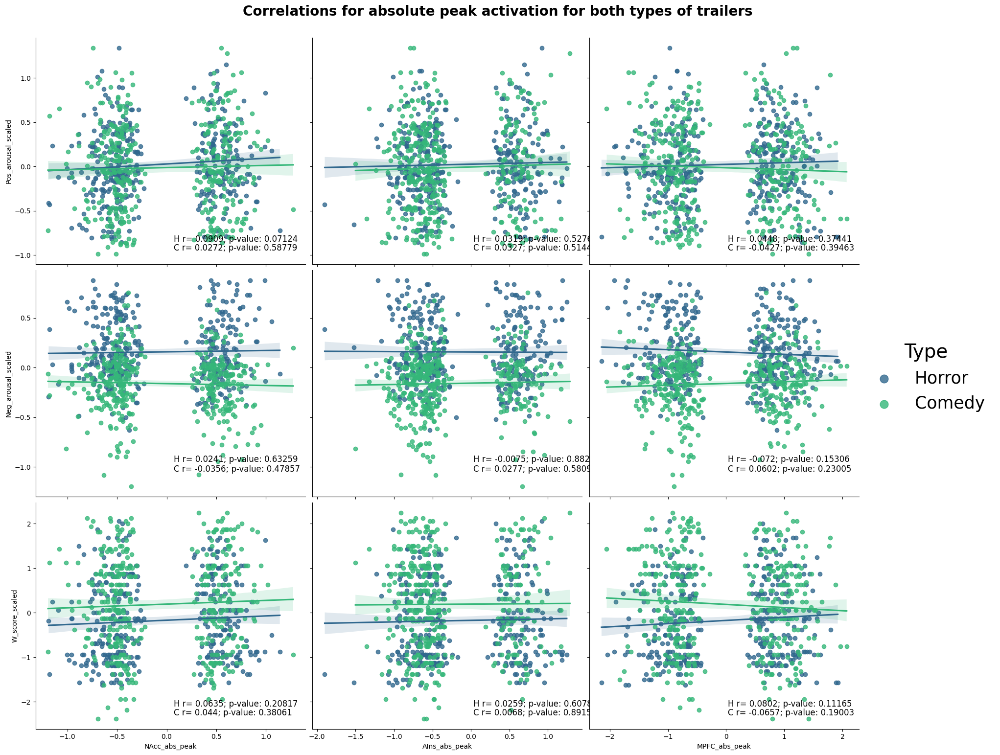

In [115]:
Pabs_comedy_corr = [NAcc_Pabs_comedy_corr, NAcc_Nabs_comedy_corr, NAcc_Wabs_comedy_corr, AIns_Pabs_comedy_corr, AIns_Nabs_comedy_corr, AIns_Wabs_comedy_corr, MPFC_Pabs_comedy_corr, MPFC_Nabs_comedy_corr, MPFC_Wabs_comedy_corr]
Pabs_horror_corr = [NAcc_Pabs_horror_corr, NAcc_Nabs_horror_corr, NAcc_Wabs_horror_corr, AIns_Pabs_horror_corr, AIns_Nabs_horror_corr, AIns_Wabs_horror_corr, MPFC_Pabs_horror_corr, MPFC_Nabs_horror_corr, MPFC_Wabs_horror_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "abs_peak", Pabs_comedy_corr, Pabs_horror_corr, "Correlations for absolute peak activation for both types of trailers")

## Neural ISC

In [116]:
# Correlation with Positive Arousal.
NAcc_PA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["W_score_scaled"])
AIns_W_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["W_score_scaled"])
MPFC_W_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_All_corr[1])))


For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: 0.05721 with a p-value of: 0.10720878463755165
For both types of trailers, the correlation between AIns ISC activation and positive arousal is: 0.03547 with a p-value of: 0.3182242001157822
For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: 0.12387 with a p-value of: 0.00046783815682415684

For both types of trailers, the correlation between NAcc ISC activation and negative arousal is: -0.03173 with a p-value of: 0.37190879501371404
For both types of trailers, the correlation between AIns ISC activation and negative arousal is: -0.04533 with a p-value of: 0.2019668587927033
For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: -0.03598 with a p-value of: 0.3112799512647371

For both types of trailers, the correlation between NAcc ISC activation and watch scores is: 0.06445 with a p-value of: 0.069497804

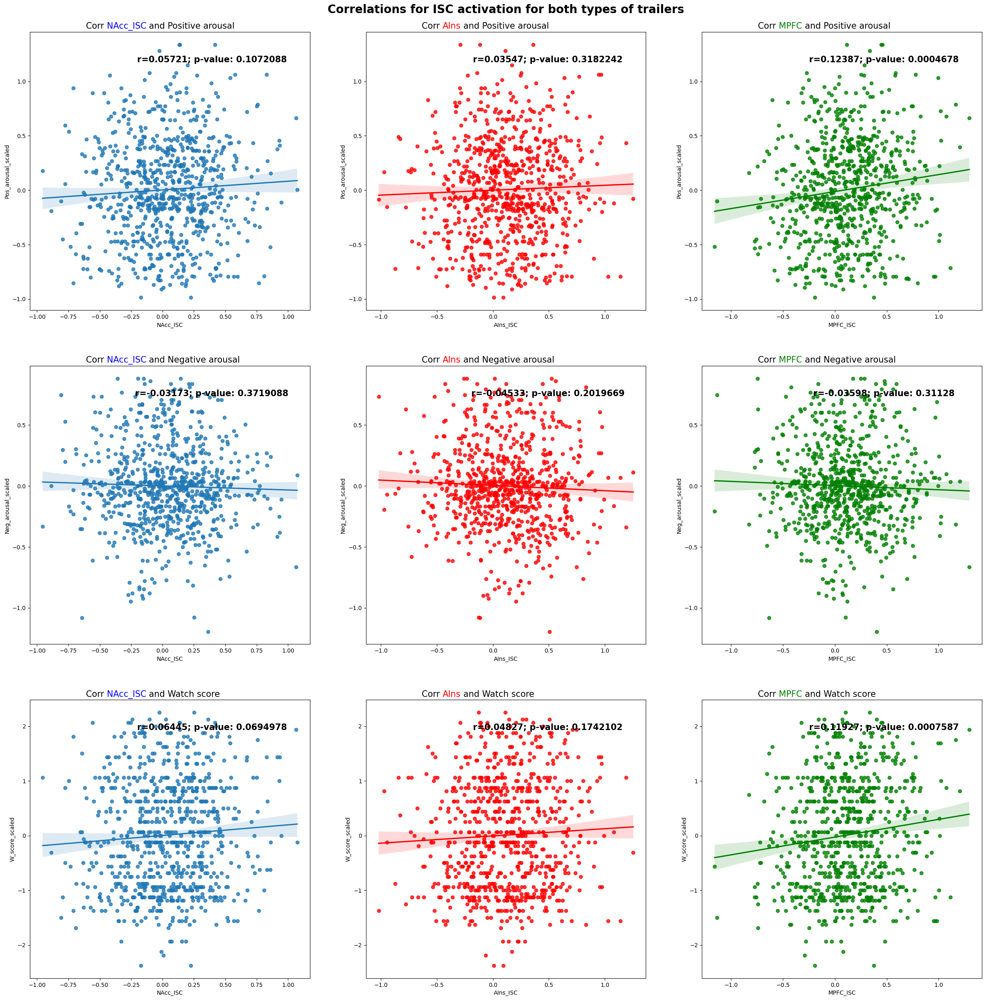

In [117]:
ISC_all_corr = [NAcc_PA_ISC_All_corr, NAcc_NA_ISC_All_corr, NAcc_W_ISC_All_corr, AIns_PA_ISC_All_corr, AIns_NA_ISC_All_corr, AIns_W_ISC_All_corr, MPFC_PA_ISC_All_corr, MPFC_NA_ISC_All_corr, MPFC_W_ISC_All_corr]
plot_correlations(all_subs_events_df, ISC_all_corr, "ISC", "Correlations for ISC activation for both types of trailers")


In [118]:
# ISC Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["W_score_scaled"])
AIns_W_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_C_corr[1])))


For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: 0.11497 with a p-value of: 0.021616952940521725
For comedy trailers, the correlation between AIns ISC activation and positive arousal is: 0.1245 with a p-value of: 0.0128177224339131
For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: 0.16033 with a p-value of: 0.001312112395346537

For comedy trailers, the correlation between NAcc ISC activation and negative arousal is: 4e-05 with a p-value of: 0.9993987166133362
For comedy trailers, the correlation between AIns ISC activation and negative arousal is: -0.09106 with a p-value of: 0.0692113816319324
For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: -0.01983 with a p-value of: 0.6928941406490026

For comedy trailers, the correlation between NAcc ISC activation and watch scores is: 0.10129 with a p-value of: 0.0431577168052484
For comedy trailers, the correlation between AI

In [119]:
# ISC Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["W_score_scaled"])
AIns_W_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["W_score_scaled"])
MPFC_W_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_H_corr[1])))



For horror trailers, the correlation between NAcc ISC activation and positive arousal is: -0.01638 with a p-value of: 0.7455747124208653
For horror trailers, the correlation between AIns ISC activation and positive arousal is: -0.06624 with a p-value of: 0.18889571969602106
For horror trailers, the correlation between MPFC ISC activation and positive arousal is: 0.08125 with a p-value of: 0.10688874732491309

For horror trailers, the correlation between NAcc ISC activation and negative arousal is: -0.07232 with a p-value of: 0.1513785314311622
For horror trailers, the correlation between AIns ISC activation and negative arousal is: 0.0337 with a p-value of: 0.5042211747292031
For horror trailers, the correlation between MPFC ISC activation and negative arousal is: -0.04999 with a p-value of: 0.3216854892960194

For horror trailers, the correlation between NAcc ISC activation and watch scores is: 0.02152 with a p-value of: 0.6697843942913756
For horror trailers, the correlation between 

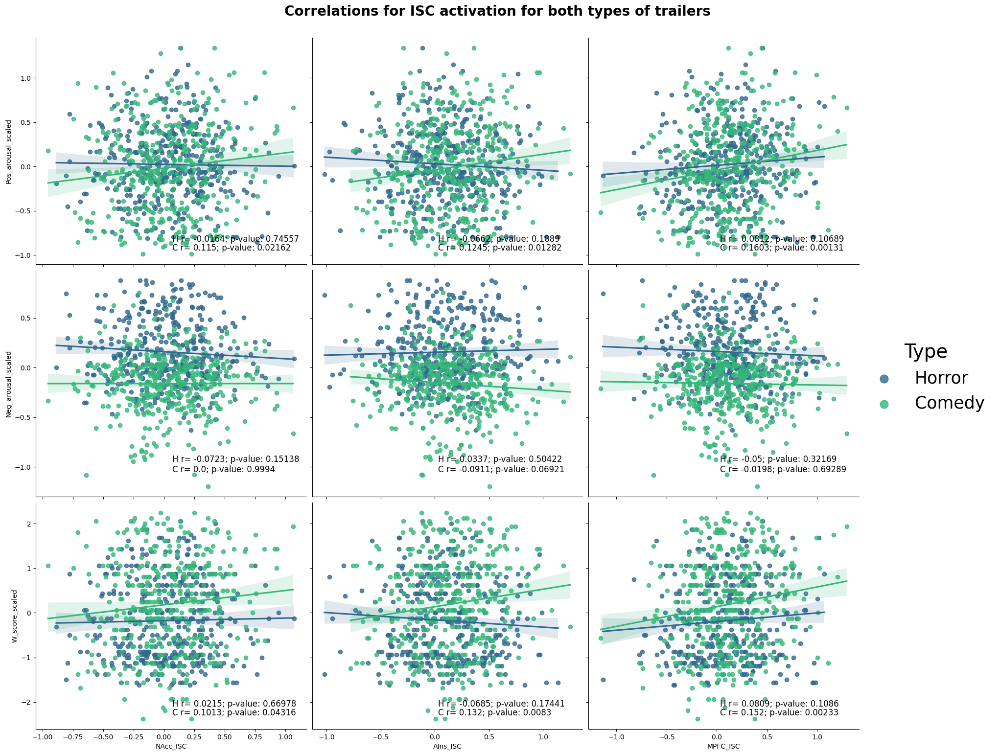

In [120]:
ISC_comedy_corr = [NAcc_PA_ISC_C_corr, NAcc_NA_ISC_C_corr, NAcc_W_ISC_C_corr, AIns_PA_ISC_C_corr, AIns_NA_ISC_C_corr, AIns_W_ISC_C_corr, MPFC_PA_ISC_C_corr, MPFC_NA_ISC_C_corr, MPFC_W_ISC_C_corr]
ISC_horror_corr = [NAcc_PA_ISC_H_corr, NAcc_NA_ISC_H_corr, NAcc_W_ISC_H_corr, AIns_PA_ISC_H_corr, AIns_NA_ISC_H_corr, AIns_W_ISC_H_corr, MPFC_PA_ISC_H_corr, MPFC_NA_ISC_H_corr, MPFC_W_ISC_H_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "ISC", ISC_comedy_corr, ISC_horror_corr, "Correlations for ISC activation for both types of trailers")


In [121]:
"""
# Not used. 
def corrfunc(x, y, **kws):
    print(x)
    r, _ = pearsonr(x, y)
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r), xy=(.65, .9), xycoords=ax.transAxes) #0.65, 0.9
"""

'\n# Not used. \ndef corrfunc(x, y, **kws):\n    print(x)\n    r, _ = pearsonr(x, y)\n    ax = plt.gca()\n    ax.annotate("r = {:.2f}".format(r), xy=(.65, .9), xycoords=ax.transAxes) #0.65, 0.9\n'